<a href="https://colab.research.google.com/github/alzimna/ara/blob/main/ara_team_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install geopandas plotly xlsxwriter cartopy contextily osmium

In [2]:
import geopandas as gpd
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import warnings
import fiona
from collections import defaultdict
import matplotlib.patches as mpatches

import osmium
import shapely.wkb
import pandas as pd
import requests

warnings.filterwarnings("ignore", category=UserWarning)

# **Data dari Geofabrik**

In [3]:
def merge_two_dicts(x, y):
    z = x.copy()   # start with keys and values of x
    z.update(y)    # modifies z with keys and values of y
    return z

class AdminAreaHandler(osmium.SimpleHandler):
    def __init__(self):
        osmium.SimpleHandler.__init__(self)

        self.areas = []
        self.wkbfab = osmium.geom.WKBFactory()

    def area(self, a):
        if  "admin_level" in a.tags:

            wkbshape = self.wkbfab.create_multipolygon(a)
            shapely_obj = shapely.wkb.loads(wkbshape, hex=True)

            area = { "id": a.id, "geo": shapely_obj }
            area = merge_two_dicts(area, a.tags)

            self.areas.append(area)

handler = AdminAreaHandler()

# path to file to local drive
# download from https://download.geofabrik.de/index.html

In [4]:
url = "https://github.com/alzimna/ara/raw/refs/heads/main/kalimantan-260118.osm.pbf"
local_file = "kalimantan-260118.osm.pbf"

r = requests.get(url, stream=True)
with open(local_file, "wb") as f:
    for chunk in r.iter_content(chunk_size=8192):
        f.write(chunk)

handler.apply_file(local_file, locations=True, idx='flex_mem')


df = pd.DataFrame(handler.areas)
kalimantan = gpd.GeoDataFrame(df, geometry="geo").set_crs(4326)
kalimantan

,id,geo,addr:city,addr:full,addr:housenumber,addr:postcode,addr:street,admin_level,building,building:levels,...,border_type:id,old_name,start_date,wikipedia:en,name:jv,name:mn,name:br,short_name:uk,sport,school:type_idn
0,454162402,"MULTIPOLYGON (((116.98968 -0.41323, 116.98968 ...",Kabupaten Kutai Kartanegara,"JL. Sutoyo, Panji, Kalimantan Timur",26,75513,Jalan Pangeran Diponegoro,5,yes,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,470823010,"MULTIPOLYGON (((116.83447 -1.26818, 116.83466 ...",NaN,Jl. Telaga Sari,NaN,NaN,NaN,5,yes,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,472266414,"MULTIPOLYGON (((114.78481 -3.8027, 114.78487 -...",NaN,Jl. A. Syairani,NaN,NaN,NaN,5,yes,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,472918222,"MULTIPOLYGON (((114.76935 -3.76899, 114.77045 ...",NaN,NaN,NaN,NaN,NaN,9,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,488078414,"MULTIPOLYGON (((115.81819 3.10217, 115.81825 3...",NaN,NaN,NaN,NaN,NaN,7,village_office,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2319,2816991706,"MULTIPOLYGON (((116.26868 -1.44862, 116.26868 ...",NaN,NaN,NaN,NaN,NaN,5,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2320,29842181,"MULTIPOLYGON (((116.17486 1.89729, 116.17552 1...",NaN,NaN,NaN,NaN,NaN,5,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2321,19768921,"MULTIPOLYGON (((117.51449 3.38413, 117.51451 3...",NaN,NaN,NaN,NaN,NaN,5,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2322,32471789,"MULTIPOLYGON (((116.83665 -1.27558, 116.83668 ...",NaN,NaN,NaN,NaN,NaN,7,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# **Map kota Pontianak**

## versi USK

In [5]:
url = "https://github.com/alzimna/ara/raw/refs/heads/main/Data%20USK/District%20Administrative%20Boundary/District_Administrative_Boundary.shx"
pontianak = gpd.read_file(url).to_crs(4326)
pontianak

,Kabupaten,geometry
0,Kota Pontianak,"POLYGON ((109.36985 0.0092, 109.37002 0.00916,..."


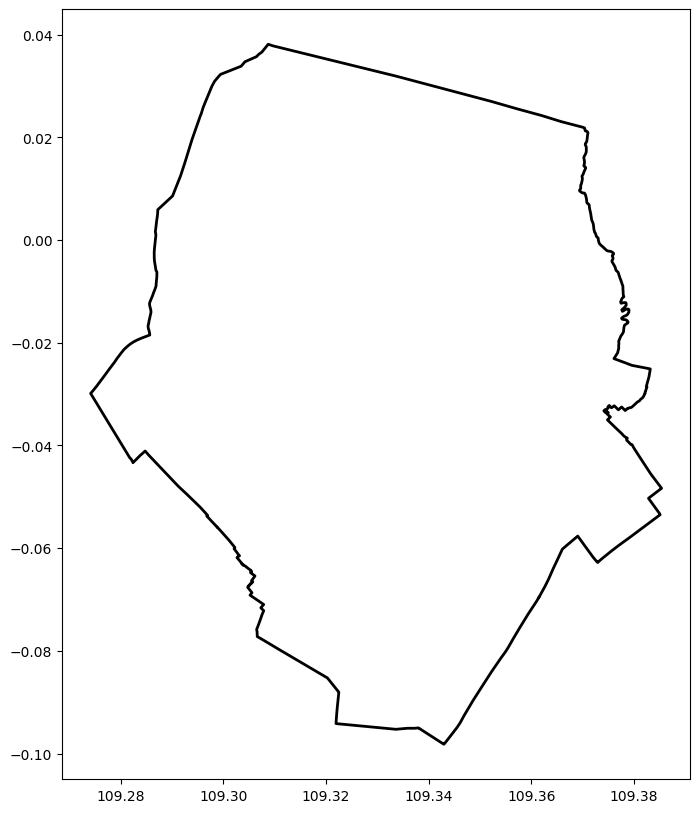

In [6]:
fig = plt.figure(figsize=(10, 10))
ax = plt.axes()

pontianak.plot(ax=ax, alpha=1, edgecolor="#000", linewidth=2, facecolor='none')
plt.show()

## versi Geofabrik

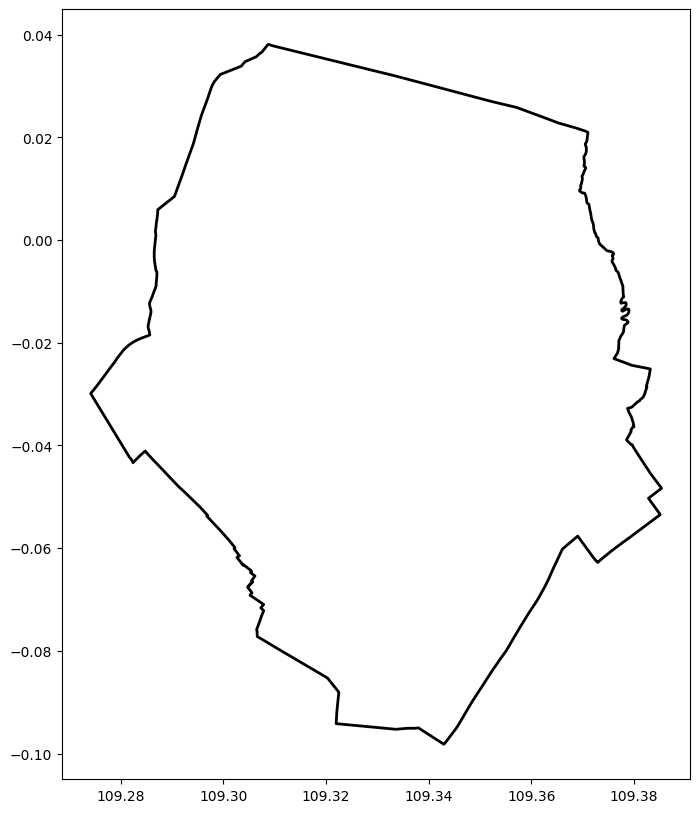

In [7]:
fig = plt.figure(figsize=(10, 10))
ax = plt.axes()

ponti = kalimantan[(kalimantan["official_name"]=="Kota Pontianak")]
ponti.set_crs(4326).plot(ax=ax, alpha=1, edgecolor="#000", linewidth=2, facecolor='none')
plt.show()

# **Data dari USK**

**Drainage**

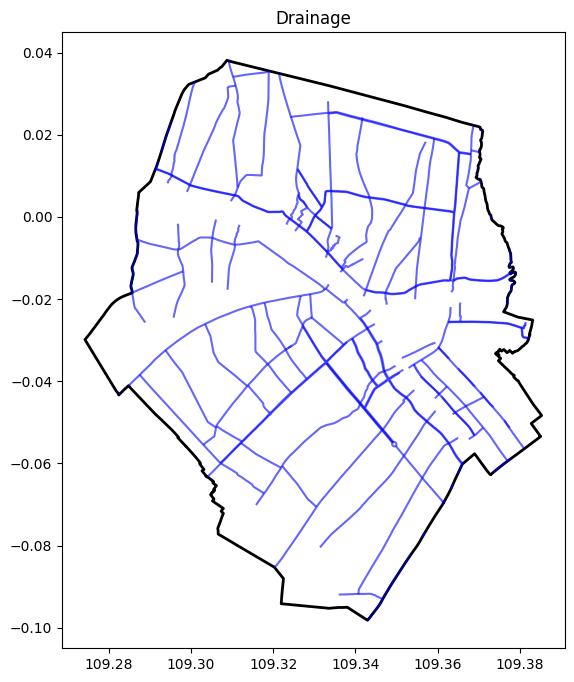

In [8]:
fig, ax = plt.subplots(figsize=(8,8))
url = "https://github.com/alzimna/ara/raw/refs/heads/main/Data%20USK/Drainage/Drainage_Pontianak.shx"
drainage = gpd.read_file(url).to_crs(4326)

geom1 = drainage.geometry.iloc[0]
geom2 = drainage.geometry.iloc[1]

luar = geom1.union(geom2)
drainage_ponti = luar.intersection(pontianak.iloc[0]["geometry"])
drainage_ponti = gpd.GeoDataFrame(geometry=[drainage_ponti], crs="EPSG:4326")

pontianak.plot(ax=ax, alpha=1, edgecolor="#000", linewidth=2, facecolor='none')
drainage_ponti.plot(ax=ax, color="blue", alpha=0.6)
plt.title("Drainage")
plt.show()

## River

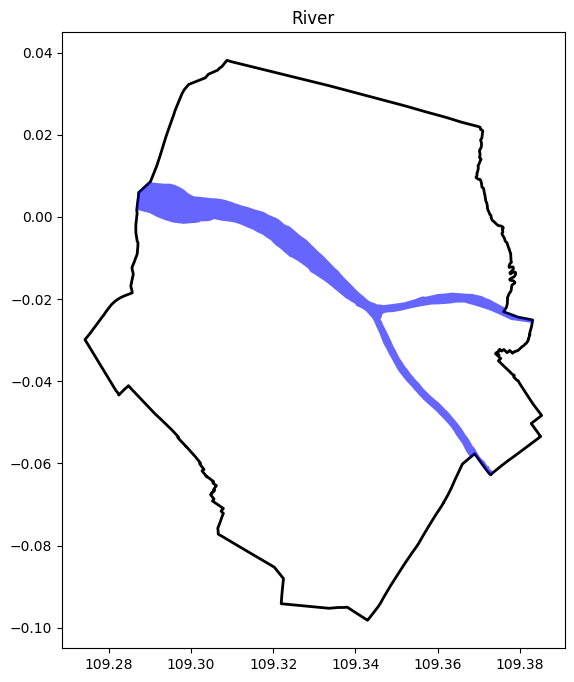

In [9]:
url = "https://github.com/alzimna/ara/raw/refs/heads/main/Data%20USK/River%20of%20Pontianak%20City%20(Polygon)/River_Pontianak.shx"
river = gpd.read_file(url).set_crs(epsg=4326)

fig, ax = plt.subplots(figsize=(8,8))

river_ponti = river.iloc[0]["geometry"].intersection(pontianak.iloc[0]["geometry"])
river_ponti = gpd.GeoDataFrame(geometry=[river_ponti], crs="EPSG:4326")

pontianak.plot(ax=ax, alpha=1, edgecolor="#000", linewidth=2, facecolor='none')
river_ponti.plot(ax=ax, color="blue", alpha=0.6)
plt.title("River")
plt.show()

## Government Building Distribution

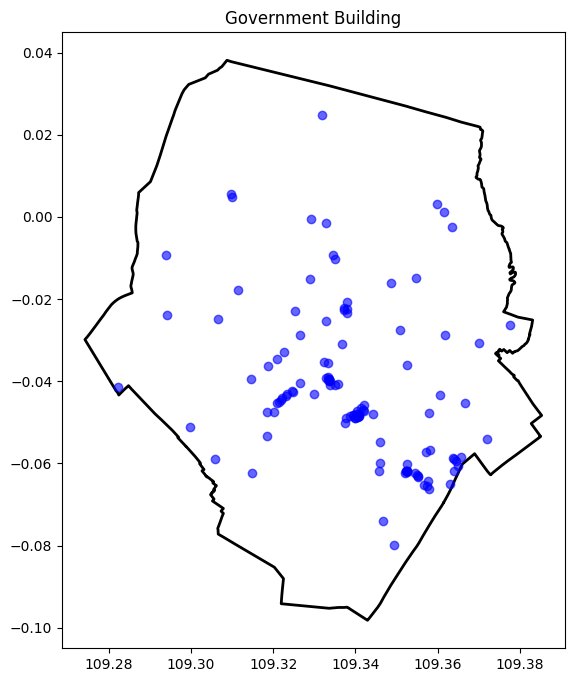

In [10]:
url = "https://github.com/alzimna/ara/raw/refs/heads/main/Data%20USK/Goverment%20Building%20Distribution/Goverment_Bulding_Distribution.shx"
gov = gpd.read_file(url)

fig, ax = plt.subplots(figsize=(8,8))

pontianak.plot(ax=ax,
               alpha=1,
               edgecolor="#000",
               linewidth=2,
               facecolor='none')
gov.plot(ax=ax,
         color="blue",
         alpha=0.6)
plt.title("Government Building")
plt.show()

## Land Cover

In [11]:
# Membuka layer bangunan dari file .osm
url = "https://github.com/alzimna/ara/raw/refs/heads/main/Data%20USK/Land_Cover/Land_Cover_Pontianak.shx"
landcov = gpd.read_file(url).to_crs(4326)
landcov.head()

,OBJECTID,FID_LandCo,pl17_id,desc_in,n,FID_Tanah_,FAOSOIL,DOMSOI,Jns_Tnh,Tanah_Umum,CN,S,Ia,Shape_Leng,Shape_Area,geometry
0,1,0,2010,Perkebunan,0.45,45,Jd9-2/3a,Jd,Entisol,Lempung Berliat,78.0,72,14,4091.079809,5.398489e+05,"MULTIPOLYGON (((109.39835 0.03104, 109.39856 0..."
1,2,1,20051,Hutan Rawa Sekunder,0.12,45,Jd9-2/3a,Jd,Entisol,Lempung Berliat,77.0,76,15,1221.272328,2.643175e+04,"POLYGON ((109.34675 0.04495, 109.34692 0.0441,..."
2,3,2,20071,Belukar Rawa,0.08,85,Od19-a,Od,Vertisol,Liat Berdebu,89.0,31,6,72867.947312,2.400039e+07,"MULTIPOLYGON (((109.29853 -0.13374, 109.29837 ..."
3,4,3,20091,Pertanian Lahan Kering,0.05,45,Jd9-2/3a,Jd,Entisol,Lempung Berliat,88.0,35,7,342208.420490,1.006952e+08,"MULTIPOLYGON (((109.26301 -0.12998, 109.26474 ..."
4,5,3,20091,Pertanian Lahan Kering,0.05,85,Od19-a,Od,Vertisol,Liat Berdebu,91.0,25,5,172256.843541,5.234579e+07,"MULTIPOLYGON (((109.30874 -0.13573, 109.30402 ..."


In [12]:
potong = []
for i in range(landcov.shape[0]) :
  temp = landcov.geometry.iloc[i].intersection(pontianak.iloc[0]["geometry"])
  if not temp.is_empty :
    potong.append(temp)
  else :
    potong.append(None)
landcov.loc[:,"geometry"] = potong

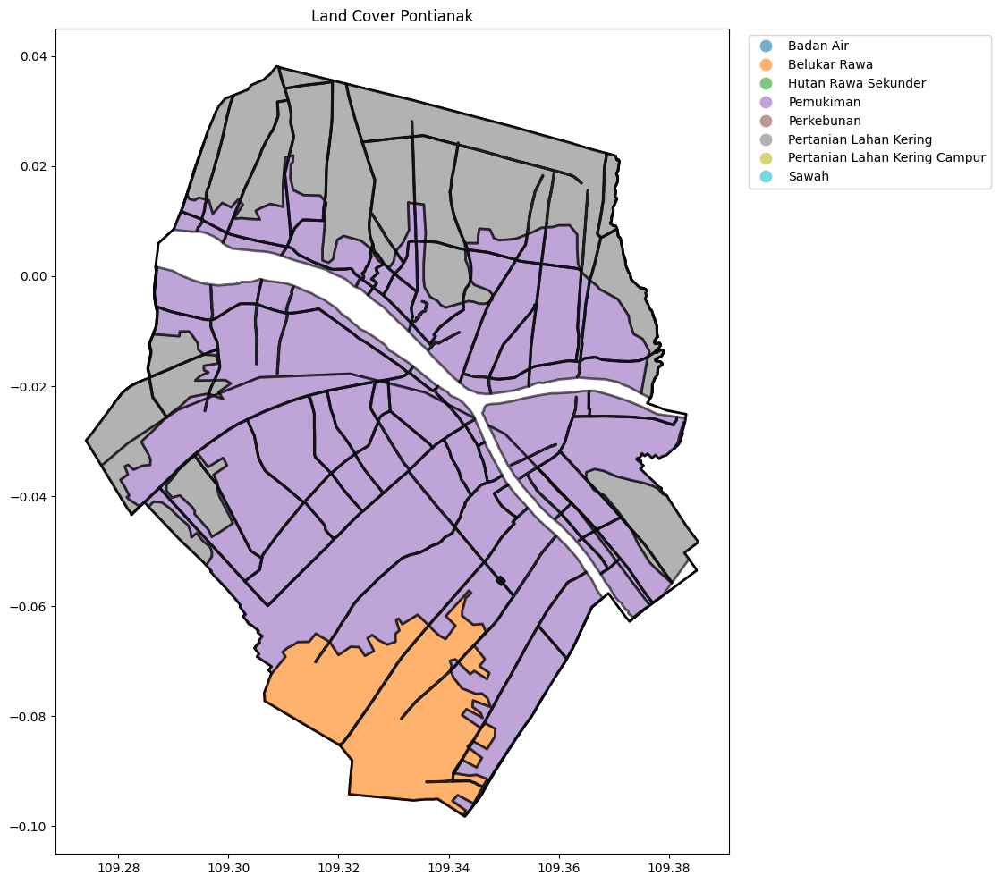

In [13]:
fig, ax = plt.subplots(figsize=(10,10))

pontianak.plot(ax=ax,
               edgecolor="black",
               linewidth=2,
               facecolor='none')

landcov.plot(
    ax=ax,
    column="desc_in",
    categorical=True,
    legend=True,
    edgecolor="black",
    linewidth=2,
    alpha=0.6
)

leg = ax.get_legend()
leg.set_bbox_to_anchor((1.02, 1))
leg.set_loc("upper left")

ax.set_title("Land Cover Pontianak")

plt.tight_layout()
plt.show()

# **Map berdasarkan kecamatan**

## versi USK

In [14]:
url = "https://github.com/alzimna/ara/raw/refs/heads/main/Data%20USK/Sub-District%20Administrative%20Boundary/Subdistrict_Administration_Boundary.shx"
kecamatan = gpd.read_file(url).to_crs(4326)

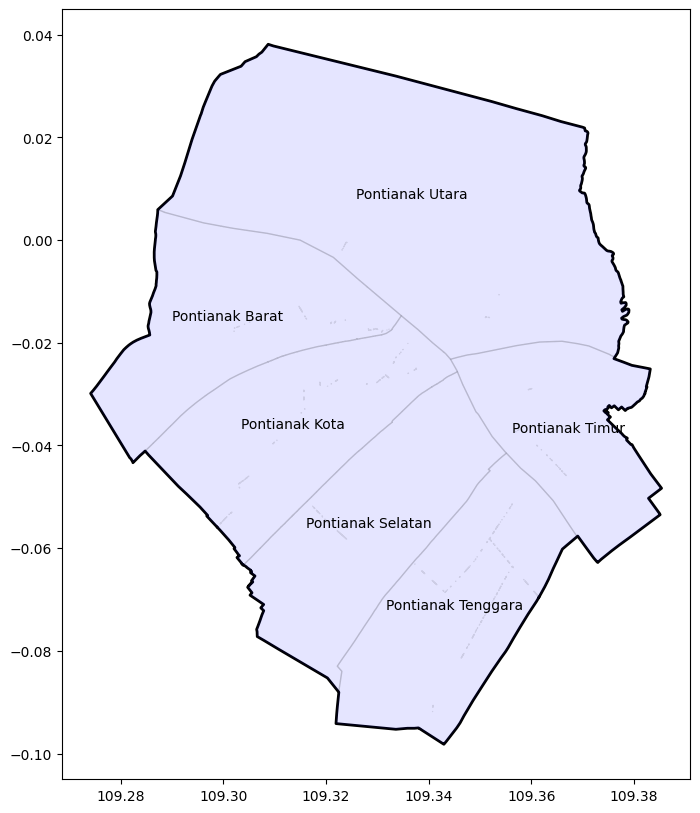

In [15]:
fig = plt.figure(figsize=(10, 10))
ax = plt.axes()

pontianak.plot(ax=ax,
               alpha=1,
               edgecolor="#000",
               linewidth=2,
               facecolor='none')

kecamatan.plot(ax=ax,
               alpha=.1,
               facecolor='b',
               edgecolor="#000",
               linewidth=1)

# add labels
for idx, row in kecamatan.iterrows() :
    ax.annotate(text=row["kecamatan"],
                xy=(row["geometry"].centroid.x,
                    row["geometry"].centroid.y),
                 horizontalalignment='center')#, xy=row.geo.centroid)

## versi Geofabrik

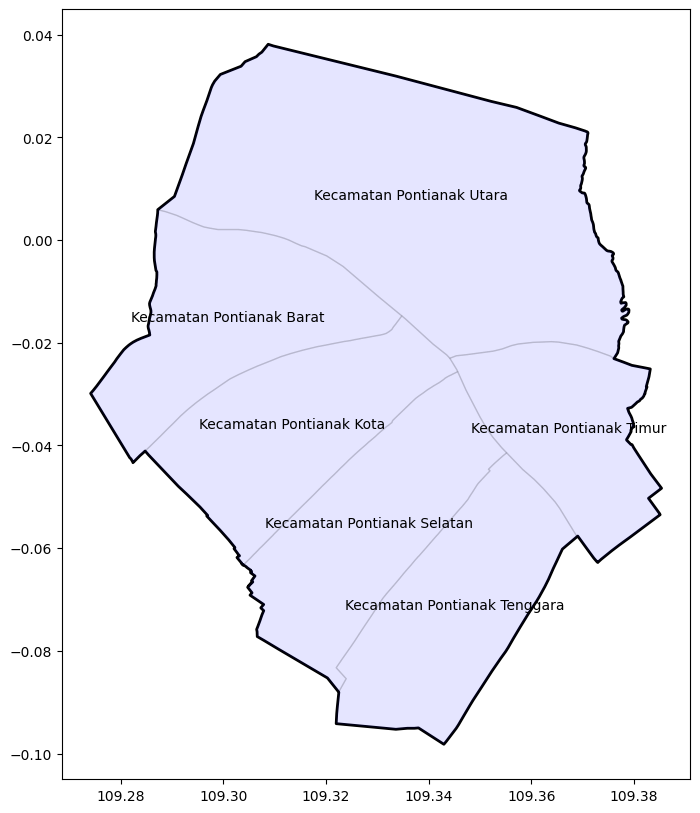

In [16]:
fig = plt.figure(figsize=(10, 10))
ax = plt.axes()

kalimantan[(kalimantan["official_name"]=="Kota Pontianak")].plot(ax=ax, alpha=1, edgecolor="#000", linewidth=2, facecolor='none')

cek = []
for i in range(len(kalimantan)) :
  temp = kalimantan["official_name"].iloc[i]
  if "Kecamatan Pontianak" in str(temp) :
    cek.append(i)
kec = kalimantan.iloc[cek].set_crs(4326)
kec.plot(ax=ax, alpha=.1, facecolor='b', edgecolor="#000", linewidth=1)

# add labels
for idx, row in kec.iterrows():
    ax.annotate(text=row["official_name"], xy=(row.geo.centroid.x, row.geo.centroid.y), horizontalalignment='center')#, xy=row.geo.centroid)

# **Map berdasarkan desa**


## versi USK

In [17]:
# Membuka layer bangunan dari file .osm
url = "https://github.com/alzimna/ara/raw/refs/heads/main/Data%20USK/Village%20Administrative%20Boundary/Village_Administrative_Boundary.shx"
desa_usk = gpd.read_file(url).to_crs(4326)

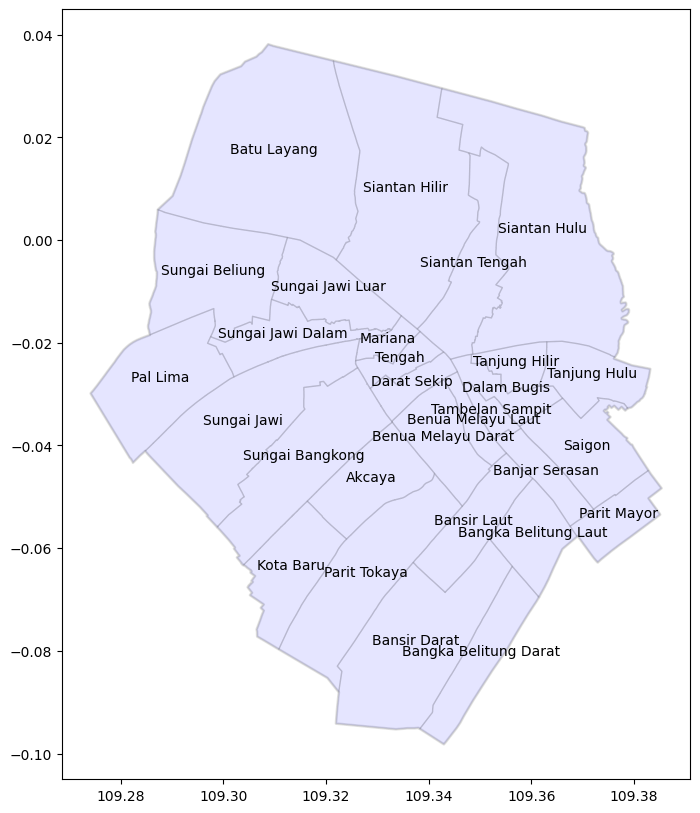

In [18]:
fig = plt.figure(figsize=(10, 10))
ax = plt.axes()

pontianak.plot(ax=ax,
               alpha=.1,
               edgecolor="#000",
               linewidth=2,
               facecolor='none')

desa_usk.plot(ax=ax,
              alpha=.1,
              facecolor='b',
              edgecolor="#000",
              linewidth=1)

# add labels
for idx, row in desa_usk.iterrows():
    ax.annotate(text=row["nmdesa"],
                xy=(row["geometry"].centroid.x,
                    row["geometry"].centroid.y),
                 horizontalalignment='center')#, xy=row.geo.centroid)

## versi Geofabrik

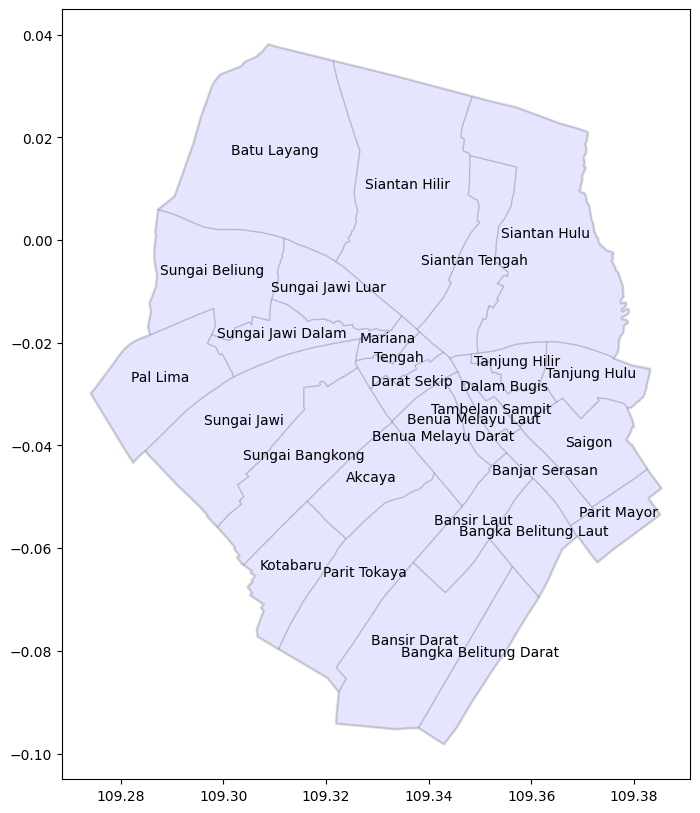

In [19]:
fig = plt.figure(figsize=(10, 10))
ax = plt.axes()

kalimantan[(kalimantan["official_name"]=="Kota Pontianak")].plot(ax=ax, alpha=.1, edgecolor="#000", linewidth=2, facecolor='none')

cek = []
for i in range(len(kalimantan)) :
  temp = kalimantan["wikipedia"].iloc[i]
  if "Pontianak" in str(temp) :
    cek.append(i)
  # if "Saigon" in str(temp) :
  #   cek.append(i)

desa = kalimantan.iloc[cek]
desa = desa[(desa["place"]=="village") | (desa["name"]=="Saigon")]
desa.plot(ax=ax, alpha=.1, facecolor='b', edgecolor="#000", linewidth=1)

# add labels
for idx, row in desa.iterrows():
    ax.annotate(text=row["name"], xy=(row.geo.centroid.x, row.geo.centroid.y), horizontalalignment='center')#, xy=row.geo.centroid)

# **Building**

## versi USK

In [20]:
# Membuka layer bangunan dari file .osm
url = "https://github.com/alzimna/ara/raw/refs/heads/main/Data%20USK/Building/Building_Footprint_Pontianak.shx"
building_usk = gpd.read_file(url)
building_usk.head()

,osm_id,osm_type,addr_stree,building,military,office,government,landuse,name,access_roo,building_m,isced_leve,addr_house,capacity,roof_mater,amenity,emergency,Kecamatan,geometry
0,574155598.0,ways_poly,None,yes,None,None,None,None,None,None,None,None,None,None,None,None,None,Pontianak Barat,"POLYGON Z ((109.28768 7.4e-5 0, 109.28778 5.54..."
1,574155627.0,ways_poly,None,yes,None,None,None,None,None,None,None,None,None,None,None,None,None,Pontianak Barat,"POLYGON Z ((109.28727 1.56615e-5 0, 109.28726 ..."
2,574155454.0,ways_poly,None,yes,None,None,None,None,None,None,None,None,None,None,None,None,None,Pontianak Barat,"POLYGON Z ((109.2868 0.00017 0, 109.28678 1.71..."
3,574155596.0,ways_poly,None,yes,None,None,None,None,None,None,None,None,None,None,None,None,None,Pontianak Barat,"POLYGON Z ((109.28779 0.00011 0, 109.28779 7.0..."
4,573354340.0,ways_poly,None,yes,None,None,None,None,None,None,None,None,None,None,None,None,None,Pontianak Timur,"POLYGON Z ((109.36338 -0.04253 0, 109.36329 -0..."


## versi Geofabrik

In [21]:
# import fiona

# url = "https://github.com/alzimna/ara/raw/refs/heads/main/Kalimantan%20OSM%202026-01-19/gis_osm_buildings_a_free_1.shx"
# fiona.listlayers(url)

In [22]:
# building = gpd.read_file(url)
# print(building.head())

In [23]:
# building.info()

In [24]:
# building["type"].unique()

ambil yang beririsan dengan pontianak

In [25]:
# luar = ponti.iloc[0]["geo"]

# mask = building.geometry.intersects(luar)
# pontianak2 = building[mask].copy()
# pontianak2.to_file("building_from_geofabrik.shp")

In [26]:
import pandas as pd
url = "https://github.com/alzimna/ara/raw/refs/heads/main/Building_Geofabrik/building_from_geofabrik.shp"
building_geofabrik = gpd.read_file(url)
building_geofabrik = building_geofabrik[building_geofabrik["geometry"].notna()]
building_geofabrik

,osm_id,code,fclass,name,type,geometry
0,123177072,1500,building,Ayani Mega Mall,commercial,"POLYGON ((109.34421 -0.05176, 109.34431 -0.051..."
1,155153671,1500,building,Gayatri,None,"POLYGON ((109.35566 -0.06503, 109.35574 -0.064..."
2,174086491,1500,building,None,None,"POLYGON ((109.32721 -0.01825, 109.32742 -0.018..."
3,174086493,1500,building,Rumah Duka St. Michael,None,"POLYGON ((109.32757 -0.01917, 109.32788 -0.019..."
4,174086496,1500,building,None,None,"POLYGON ((109.32765 -0.01977, 109.32765 -0.019..."
...,...,...,...,...,...,...
150942,1457486452,1500,building,None,None,"POLYGON ((109.34341 -0.06879, 109.34355 -0.068..."
150943,1457486453,1500,building,None,None,"POLYGON ((109.34406 -0.06933, 109.3441 -0.0693..."
150944,1457486454,1500,building,None,None,"POLYGON ((109.34393 -0.06941, 109.34405 -0.069..."
150945,1457491875,1500,building,None,None,"POLYGON ((109.3338 -0.0238, 109.33382 -0.02375..."


## versi BBBike

In [27]:
url = "https://github.com/alzimna/ara/raw/refs/heads/main/Bbbike/shape/buildings.shx"
bbbike = gpd.read_file(url)

#masking pontianak
luar = ponti.iloc[0]["geo"]
mask = bbbike.geometry.intersects(luar)
building_bbbike = bbbike[mask].copy()
building_bbbike.drop_duplicates(subset=["geometry"], inplace=True)

# **Menambahkan wilayah administrasi**

# **Data USK**

## Tambah kota

In [28]:
building_usk = building_usk.drop(columns=["Kecamatan"])
building_usk = building_usk[building_usk["geometry"].notna()].copy()
building_usk.loc[:, "Kota"] = "Kota Pontianak"

## Tambah Kecamatan

In [29]:
joined = gpd.sjoin(
    building_usk,
    kec[["geo", "official_name"]],
    how="left",
    predicate="intersects"
)

joined = joined.rename(columns={"official_name": "Kecamatan"})
joined = joined.drop(columns=["index_right"])
building_usk = joined.copy()

## Tambah Desa

In [30]:
joined = gpd.sjoin(
    building_usk,
    desa[["geo", "name"]],
    how="left",
    predicate="intersects"
)

joined = joined.rename(columns={"name_right": "Desa"})
joined = joined.drop(columns=["index_right"])
building_usk = joined.copy()

building_usk.drop_duplicates(subset=["geometry"], inplace=True)
n_usk = building_usk.shape[0]

# **Data geofabrik (osm based)**

## Tambah kota

In [31]:
building_geofabrik = building_geofabrik[building_geofabrik["geometry"].notna()].copy()
building_geofabrik.loc[:, "Kota"] = "Kota Pontianak"

## Tambah Kecamatan

In [32]:
joined = gpd.sjoin(
    building_geofabrik,
    kec[["geo", "official_name"]],
    how="left",
    predicate="intersects"
)

joined = joined.rename(columns={"official_name": "Kecamatan"})
joined = joined.drop(columns=["index_right"])
building_geofabrik = joined.copy()

## Tambah Desa

In [33]:
joined = gpd.sjoin(
    building_geofabrik,
    desa[["geo", "name"]],
    how="left",
    predicate="intersects"
)

joined = joined.rename(columns={"name_right": "Desa"})
joined = joined.drop(columns=["index_right"])
building_geofabrik = joined.copy()

building_geofabrik.drop_duplicates(subset=["geometry"], inplace=True)
n_geofabrik = building_geofabrik.shape[0]

# **Data BBBIKE**

## Tambah kota

In [34]:
building_bbbike = building_bbbike[building_bbbike["geometry"].notna()].copy()
building_bbbike.loc[:, "Kota"] = "Kota Pontianak"

## Tambah Kecamatan

In [35]:
joined = gpd.sjoin(
    building_bbbike,
    kec[["geo", "official_name"]],
    how="left",
    predicate="intersects"
)

joined = joined.rename(columns={"official_name": "Kecamatan"})
joined = joined.drop(columns=["index_right"])
building_bbbike = joined.copy()

## Tambah Desa

In [36]:
joined = gpd.sjoin(
    building_bbbike,
    desa[["geo", "name"]],
    how="left",
    predicate="intersects"
)

joined = joined.rename(columns={"name_right": "Desa"})
joined = joined.drop(columns=["index_right"])
building_bbbike = joined.copy()

building_bbbike.drop_duplicates(subset=["geometry"], inplace=True)
n_bbbike = building_bbbike.shape[0]

#**Compile Data OSM**

In [37]:
url = "https://github.com/alzimna/ara/raw/refs/heads/main/Building_OSM/map.osm"
building_osm = gpd.read_file(url,layer = "multipolygons")
for i in range(1,40) :
  url = f'https://github.com/alzimna/ara/raw/refs/heads/main/Building_OSM/map%20({i}).osm'
  temp = gpd.read_file(url,layer = "multipolygons")
  building_osm = pd.concat([building_osm, temp])

In [38]:
building_osm

,osm_id,osm_way_id,name,type,aeroway,amenity,admin_level,barrier,boundary,building,...,man_made,military,natural,office,place,shop,sport,tourism,other_tags,geometry
0,None,304181959,Terminal Batulayang,None,None,bus_station,None,None,None,None,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((109.29283 0.01336, 109.29362 0..."
1,None,412022894,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((109.26618 0.01892, 109.26628 0..."
2,None,412028054,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((109.26694 0.01972, 109.26685 0..."
3,None,412028055,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((109.26675 0.01933, 109.26711 0..."
4,None,412028056,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((109.26921 0.0181, 109.26942 0...."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4840,None,890854571,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((109.23691 -0.03055, 109.23687 ..."
4841,None,911363126,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((109.24764 -0.06412, 109.24782 ..."
4842,None,1075217656,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((109.23638 -0.05666, 109.23638 ..."
4843,None,1075217657,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((109.23579 -0.05665, 109.23541 ..."


In [39]:
luar = ponti.iloc[0]["geo"]

mask = building_osm.geometry.intersects(luar)
building_osm_luar = building_osm[~mask].copy()
building_osm = building_osm[mask].copy()

n_osm = building_osm.shape[0]
building_osm

,osm_id,osm_way_id,name,type,aeroway,amenity,admin_level,barrier,boundary,building,...,man_made,military,natural,office,place,shop,sport,tourism,other_tags,geometry
0,None,304181959,Terminal Batulayang,None,None,bus_station,None,None,None,None,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((109.29283 0.01336, 109.29362 0..."
22,None,522379685,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((109.29878 0.00905, 109.29883 0..."
23,None,522379686,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((109.29877 0.00892, 109.29912 0..."
24,None,522379687,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((109.29825 0.00899, 109.29833 0..."
25,None,522379870,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((109.29727 0.00879, 109.29724 0..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7878,None,1133352711,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((109.30543 -0.05962, 109.30552 ..."
7879,None,1133352712,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((109.30577 -0.05974, 109.30583 ..."
7880,None,1133352713,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((109.3055 -0.05979, 109.30566 -..."
7881,None,1133352732,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((109.30646 -0.05961, 109.30653 ..."


## Tambah kota

In [40]:
building_osm = building_osm[building_osm["geometry"].notna()].copy()
building_osm.loc[:, "Kota"] = "Kota Pontianak"

## Tambah Kecamatan

In [41]:
joined = gpd.sjoin(
    building_osm,
    kec[["geo", "official_name"]],
    how="left",
    predicate="intersects"
)

joined = joined.rename(columns={"official_name": "Kecamatan"})
joined = joined.drop(columns=["index_right"])
building_osm = joined.copy()

## Tambah Desa

In [42]:
joined = gpd.sjoin(
    building_osm,
    desa[["geo", "name"]],
    how="left",
    predicate="intersects"
)

joined = joined.rename(columns={"name_right": "Desa"})
joined = joined.drop(columns=["index_right"])
building_osm = joined.copy()

In [43]:
building_osm = building_osm[building_osm["boundary"].isna()].copy()
x1 = building_osm.copy()
building_osm.drop_duplicates(subset=["geometry"], inplace=True)
n_osm = building_osm.shape[0]
building_osm

,osm_id,osm_way_id,name_left,type,aeroway,amenity,admin_level,barrier,boundary,building,...,office,place,shop,sport,tourism,other_tags,geometry,Kota,Kecamatan,Desa
0,None,304181959,Terminal Batulayang,None,None,bus_station,None,None,None,None,...,None,None,None,None,None,None,"MULTIPOLYGON (((109.29283 0.01336, 109.29362 0...",Kota Pontianak,Kecamatan Pontianak Utara,Batu Layang
22,None,522379685,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,"MULTIPOLYGON (((109.29878 0.00905, 109.29883 0...",Kota Pontianak,Kecamatan Pontianak Utara,Batu Layang
23,None,522379686,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,"MULTIPOLYGON (((109.29877 0.00892, 109.29912 0...",Kota Pontianak,Kecamatan Pontianak Utara,Batu Layang
24,None,522379687,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,"MULTIPOLYGON (((109.29825 0.00899, 109.29833 0...",Kota Pontianak,Kecamatan Pontianak Utara,Batu Layang
25,None,522379870,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,"MULTIPOLYGON (((109.29727 0.00879, 109.29724 0...",Kota Pontianak,Kecamatan Pontianak Utara,Batu Layang
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7878,None,1133352711,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,"MULTIPOLYGON (((109.30543 -0.05962, 109.30552 ...",Kota Pontianak,Kecamatan Pontianak Kota,Sungai Bangkong
7879,None,1133352712,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,"MULTIPOLYGON (((109.30577 -0.05974, 109.30583 ...",Kota Pontianak,Kecamatan Pontianak Kota,Sungai Bangkong
7880,None,1133352713,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,"MULTIPOLYGON (((109.3055 -0.05979, 109.30566 -...",Kota Pontianak,Kecamatan Pontianak Kota,Sungai Bangkong
7881,None,1133352732,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,None,"MULTIPOLYGON (((109.30646 -0.05961, 109.30653 ...",Kota Pontianak,Kecamatan Pontianak Kota,Sungai Bangkong


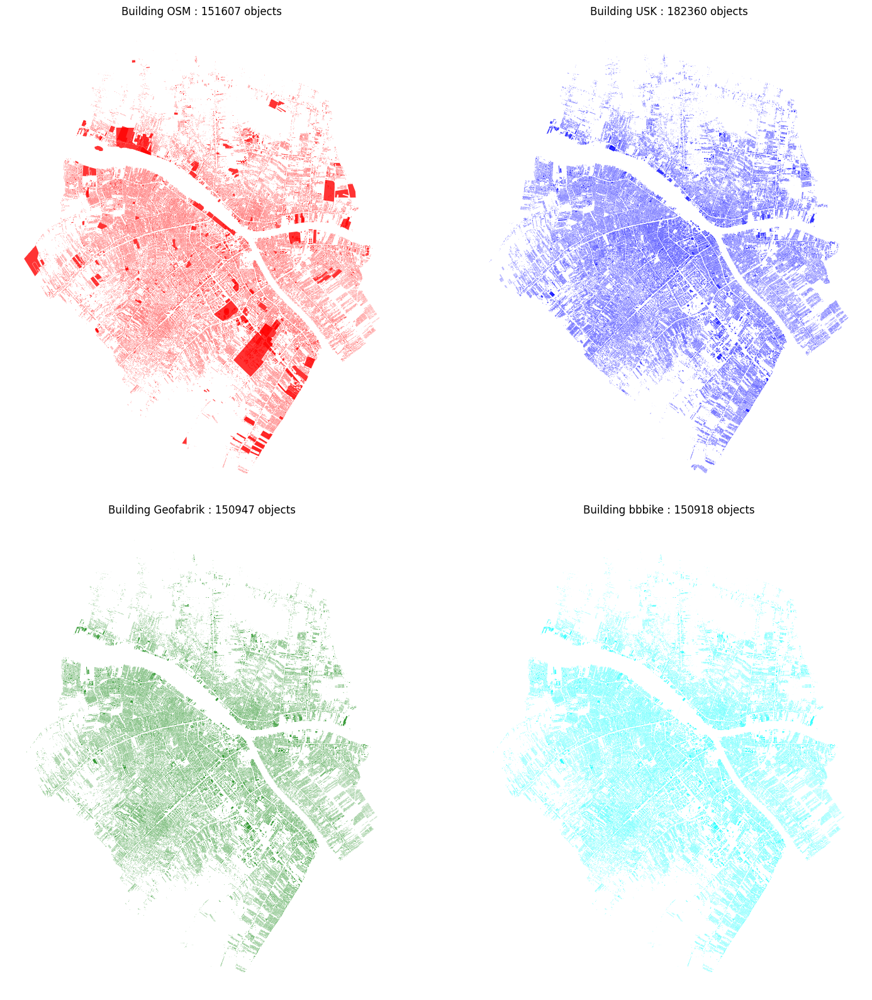

In [44]:
fig, axes = plt.subplots(2, 2, figsize=(16, 16))

building_osm.plot(ax=axes[0][0], color="red", alpha=0.8)
axes[0][0].set_title(f"Building OSM : {n_osm} objects")
axes[0][0].set_axis_off()

building_usk.plot(ax=axes[0][1], color="blue", alpha=0.8)
axes[0][1].set_title(f"Building USK : {n_usk} objects")
axes[0][1].set_axis_off()

building_geofabrik.plot(ax=axes[1][0], color="green", alpha=0.8)
axes[1][0].set_title(f"Building Geofabrik : {n_geofabrik} objects")
axes[1][0].set_axis_off()

building_bbbike.plot(ax=axes[1][1], color="cyan", alpha=0.8)
axes[1][1].set_title(f"Building bbbike : {n_bbbike} objects")
axes[1][1].set_axis_off()


plt.tight_layout()
plt.show()

# Data Raw untuk Survey
Kita coba pakai data hasil OSM

In [45]:
# data_raw = building_osm.copy()

# sheets_kecamatan = defaultdict()
# list_kecamatan = data_raw.Kecamatan.unique()

# for item in list_kecamatan :
#   sheets_kecamatan[item] = data_raw[data_raw.Kecamatan == item]

# sheets_desa = defaultdict()
# list_desa = data_raw.Desa.unique()

# for item in list_desa :
#   sheets_desa[item] = data_raw[data_raw.Desa == item]

# with pd.ExcelWriter("data_raw.xlsx", engine="xlsxwriter") as writer:
#     data_raw.assign(geometry=data_raw.geometry.to_wkt()) \
#         .to_excel(writer, sheet_name="main", index=False)

#     for item in list_kecamatan :
#       sheets_kecamatan[item].assign(geometry=sheets_kecamatan[item].geometry.to_wkt()) \
#         .to_excel(writer, sheet_name=item, index=False)

#     for item in list_desa :
#       sheets_desa[item].assign(geometry=sheets_desa[item].geometry.to_wkt()) \
#         .to_excel(writer, sheet_name=item, index=False)

In [46]:
data_raw = building_osm.copy().reset_index(drop = True)

data_raw.loc[:,"lat"] = data_raw.geometry.centroid.y
data_raw.loc[:,"lon"] = data_raw.geometry.centroid.x
data_raw.loc[:,"gmaps"] = data_raw["lat"].astype(str) + "," + data_raw["lon"].astype(str)
data_raw = data_raw.drop(columns=["lat","lon"])
data_raw

,osm_id,osm_way_id,name_left,type,aeroway,amenity,admin_level,barrier,boundary,building,...,place,shop,sport,tourism,other_tags,geometry,Kota,Kecamatan,Desa,gmaps
0,None,304181959,Terminal Batulayang,None,None,bus_station,None,None,None,None,...,None,None,None,None,None,"MULTIPOLYGON (((109.29283 0.01336, 109.29362 0...",Kota Pontianak,Kecamatan Pontianak Utara,Batu Layang,"0.012294525036680203,109.29295637422888"
1,None,522379685,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,"MULTIPOLYGON (((109.29878 0.00905, 109.29883 0...",Kota Pontianak,Kecamatan Pontianak Utara,Batu Layang,"0.009034650000000002,109.29889819999998"
2,None,522379686,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,"MULTIPOLYGON (((109.29877 0.00892, 109.29912 0...",Kota Pontianak,Kecamatan Pontianak Utara,Batu Layang,"0.008740998840660402,109.29890238420168"
3,None,522379687,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,"MULTIPOLYGON (((109.29825 0.00899, 109.29833 0...",Kota Pontianak,Kecamatan Pontianak Utara,Batu Layang,"0.008960233003002303,109.29850111920736"
4,None,522379870,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,"MULTIPOLYGON (((109.29727 0.00879, 109.29724 0...",Kota Pontianak,Kecamatan Pontianak Utara,Batu Layang,"0.008772981467637646,109.29723094613973"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
151602,None,1133352711,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,"MULTIPOLYGON (((109.30543 -0.05962, 109.30552 ...",Kota Pontianak,Kecamatan Pontianak Kota,Sungai Bangkong,"-0.059742684309680896,109.30542280980495"
151603,None,1133352712,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,"MULTIPOLYGON (((109.30577 -0.05974, 109.30583 ...",Kota Pontianak,Kecamatan Pontianak Kota,Sungai Bangkong,"-0.059843411687336624,109.30573045906135"
151604,None,1133352713,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,"MULTIPOLYGON (((109.3055 -0.05979, 109.30566 -...",Kota Pontianak,Kecamatan Pontianak Kota,Sungai Bangkong,"-0.05989979999999927,109.305544"
151605,None,1133352732,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,"MULTIPOLYGON (((109.30646 -0.05961, 109.30653 ...",Kota Pontianak,Kecamatan Pontianak Kota,Sungai Bangkong,"-0.05968553547192793,109.30645411554305"


Karena banyak bangunan yang tidak teridentifikasi kegunaannya, mungkin sebaiknya sample frame dibatasi hanya daerah yang beresiko terkena banjir. Ada 3 definisi daerah beresiko banjir yang bisa dipakai.



1. Setiap desa yang berjarak tertentu dengan sungai dikatakan beresiko banjir
2. Setiap bangunan yang berjarak tertentu dengan sungai dikatakan beresiko banjir
3. Menggunakan hasil simulasi dari USK



## Alternatif 1

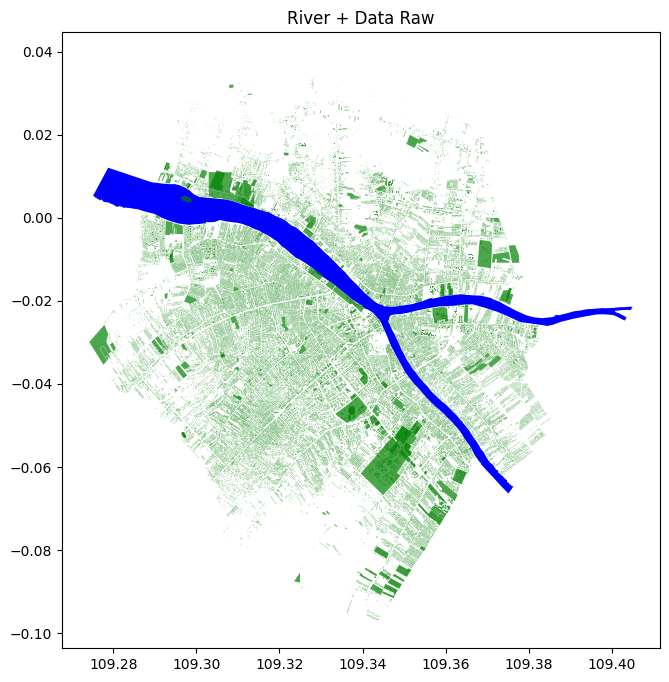

In [47]:
fig, ax = plt.subplots(figsize=(8,8))

river.plot(ax=ax,
           color="blue",
           linewidth=1)
data_raw.plot(ax=ax,
              color="green",
              alpha=0.7)

plt.title("River + Data Raw")
plt.show()

## Desa yang rawan terkena banjir

In [48]:
luar = river.iloc[0]["geometry"]
mask = desa.intersects(luar)
high_risk_1 = desa[mask].copy()
high_risk_1["name"]

,name
1958,Parit Mayor
1959,Tambelan Sampit
1960,Darat Sekip
1961,Dalam Bugis
1962,Benua Melayu Laut
1963,Tanjung Hilir
1964,Tanjung Hulu
1965,Siantan Tengah
1966,Siantan Hulu
1969,Sungai Beliung


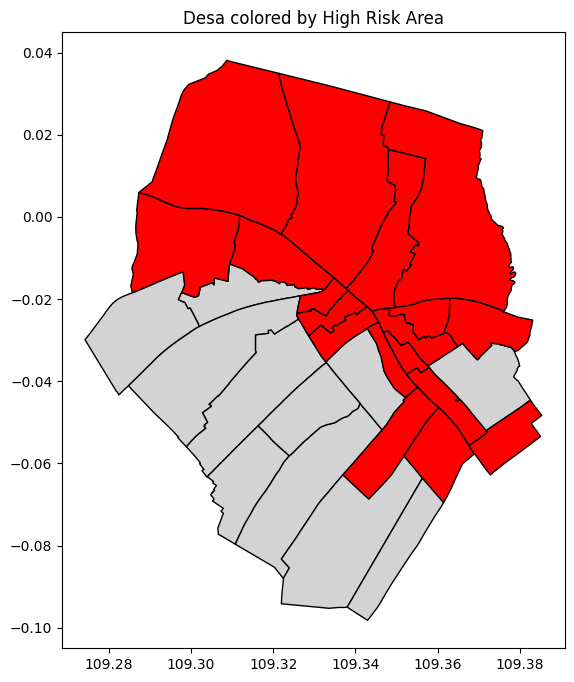

In [49]:
fig, ax = plt.subplots(figsize=(8,8))

desa["risk"] = desa["name"].isin(high_risk_1["name"])

# Plot non-risk first
desa[~desa["risk"]].plot(ax=ax, color="lightgray", edgecolor="black")

# Plot high-risk on top
desa[desa["risk"]].plot(ax=ax, color="red", edgecolor="black")

plt.title("Desa colored by High Risk Area")
plt.show()

In [50]:
data_raw_high_risk = data_raw[data_raw["Desa"].isin(high_risk_1["name"])]
data_raw_high_risk

,osm_id,osm_way_id,name_left,type,aeroway,amenity,admin_level,barrier,boundary,building,...,place,shop,sport,tourism,other_tags,geometry,Kota,Kecamatan,Desa,gmaps
0,None,304181959,Terminal Batulayang,None,None,bus_station,None,None,None,None,...,None,None,None,None,None,"MULTIPOLYGON (((109.29283 0.01336, 109.29362 0...",Kota Pontianak,Kecamatan Pontianak Utara,Batu Layang,"0.012294525036680203,109.29295637422888"
1,None,522379685,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,"MULTIPOLYGON (((109.29878 0.00905, 109.29883 0...",Kota Pontianak,Kecamatan Pontianak Utara,Batu Layang,"0.009034650000000002,109.29889819999998"
2,None,522379686,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,"MULTIPOLYGON (((109.29877 0.00892, 109.29912 0...",Kota Pontianak,Kecamatan Pontianak Utara,Batu Layang,"0.008740998840660402,109.29890238420168"
3,None,522379687,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,"MULTIPOLYGON (((109.29825 0.00899, 109.29833 0...",Kota Pontianak,Kecamatan Pontianak Utara,Batu Layang,"0.008960233003002303,109.29850111920736"
4,None,522379870,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,"MULTIPOLYGON (((109.29727 0.00879, 109.29724 0...",Kota Pontianak,Kecamatan Pontianak Utara,Batu Layang,"0.008772981467637646,109.29723094613973"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139209,None,574646285,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,"MULTIPOLYGON (((109.38362 -0.05218, 109.38357 ...",Kota Pontianak,Kecamatan Pontianak Timur,Parit Mayor,"-0.05212989999999999,109.38361319999997"
139210,None,574646286,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,"MULTIPOLYGON (((109.38368 -0.05212, 109.38364 ...",Kota Pontianak,Kecamatan Pontianak Timur,Parit Mayor,"-0.05207764999999963,109.38368385"
139211,None,740085151,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,"MULTIPOLYGON (((109.38391 -0.05227, 109.38396 ...",Kota Pontianak,Kecamatan Pontianak Timur,Parit Mayor,"-0.05228843314161384,109.38396054930342"
139212,None,740085152,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,"MULTIPOLYGON (((109.38381 -0.05214, 109.38386 ...",Kota Pontianak,Kecamatan Pontianak Timur,Parit Mayor,"-0.05214590039516785,109.38385313328166"


## Alternatif 2
Setiap bangunan yang berjarak tertentu dengan sungai dikatakan beresiko tinggi

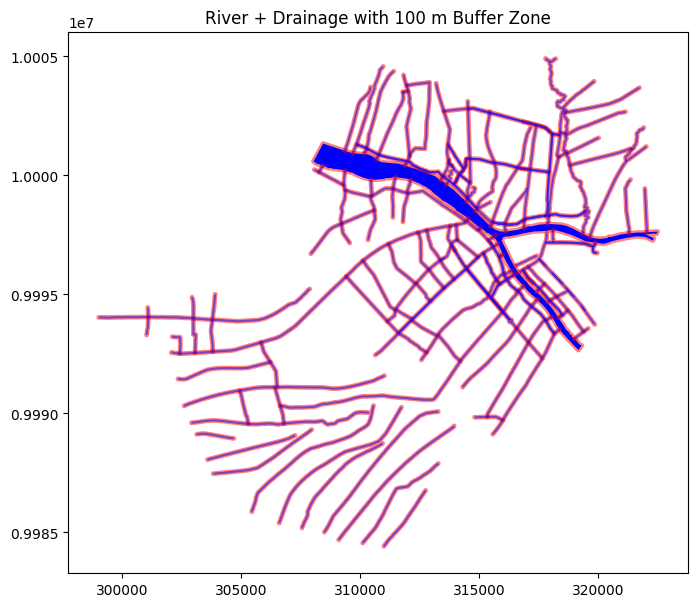

In [51]:
buff = 100
river_m = river.to_crs(32749)
drainage_m = drainage.to_crs(32749)     # meters
buffer_m = river_m.buffer(buff)
buffer_d = drainage_m.buffer(buff)

fig, ax = plt.subplots(figsize=(8,8))

buffer_m.plot(ax=ax, color="red", alpha=0.5, edgecolor="none")

river_m.plot(ax=ax, color="blue", linewidth=2)

drainage_m.plot(ax=ax, color="blue", alpha=0.5)

buffer_d.plot(ax=ax, color="red", alpha=0.5)

plt.title(f'River + Drainage with {buff} m Buffer Zone')
plt.show()

In [52]:
from shapely.ops import unary_union

buffer_m_deg = gpd.GeoDataFrame(geometry=buffer_m).to_crs(4326)
buffer_d_deg = gpd.GeoDataFrame(geometry=buffer_d).to_crs(4326)
luar_1 = buffer_m_deg.iloc[0]["geometry"]

geom1 = buffer_d_deg.geometry.iloc[0]
geom2 = buffer_d_deg.geometry.iloc[1]

luar_2 = geom1.union(geom2)

In [53]:
mask = (data_raw.intersects(luar_1)) | (data_raw.intersects(luar_2))
high_risk_2 = data_raw[mask].copy()
high_risk_2.drop_duplicates(subset=["geometry"], inplace=True)
high_risk_2

,osm_id,osm_way_id,name_left,type,aeroway,amenity,admin_level,barrier,boundary,building,...,place,shop,sport,tourism,other_tags,geometry,Kota,Kecamatan,Desa,gmaps
0,None,304181959,Terminal Batulayang,None,None,bus_station,None,None,None,None,...,None,None,None,None,None,"MULTIPOLYGON (((109.29283 0.01336, 109.29362 0...",Kota Pontianak,Kecamatan Pontianak Utara,Batu Layang,"0.012294525036680203,109.29295637422888"
1,None,522379685,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,"MULTIPOLYGON (((109.29878 0.00905, 109.29883 0...",Kota Pontianak,Kecamatan Pontianak Utara,Batu Layang,"0.009034650000000002,109.29889819999998"
2,None,522379686,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,"MULTIPOLYGON (((109.29877 0.00892, 109.29912 0...",Kota Pontianak,Kecamatan Pontianak Utara,Batu Layang,"0.008740998840660402,109.29890238420168"
3,None,522379687,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,"MULTIPOLYGON (((109.29825 0.00899, 109.29833 0...",Kota Pontianak,Kecamatan Pontianak Utara,Batu Layang,"0.008960233003002303,109.29850111920736"
4,None,522379870,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,"MULTIPOLYGON (((109.29727 0.00879, 109.29724 0...",Kota Pontianak,Kecamatan Pontianak Utara,Batu Layang,"0.008772981467637646,109.29723094613973"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
151598,None,1117944020,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,"MULTIPOLYGON (((109.30545 -0.0525, 109.30549 -...",Kota Pontianak,Kecamatan Pontianak Kota,Sungai Bangkong,"-0.05249090510767254,109.30553296321312"
151601,None,1133352710,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,"MULTIPOLYGON (((109.30554 -0.05961, 109.30559 ...",Kota Pontianak,Kecamatan Pontianak Kota,Sungai Bangkong,"-0.05956987791768404,109.30546592489704"
151603,None,1133352712,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,"MULTIPOLYGON (((109.30577 -0.05974, 109.30583 ...",Kota Pontianak,Kecamatan Pontianak Kota,Sungai Bangkong,"-0.059843411687336624,109.30573045906135"
151605,None,1133352732,None,None,None,None,None,None,None,yes,...,None,None,None,None,None,"MULTIPOLYGON (((109.30646 -0.05961, 109.30653 ...",Kota Pontianak,Kecamatan Pontianak Kota,Sungai Bangkong,"-0.05968553547192793,109.30645411554305"


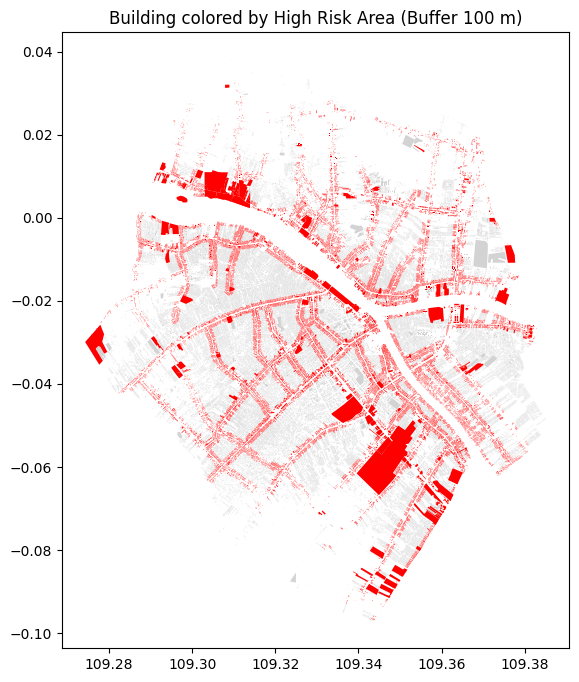

In [54]:
fig, ax = plt.subplots(figsize=(8,8))

data_raw["risk"] = mask

# Plot non-risk first
data_raw[~data_raw["risk"]].plot(ax=ax,
                                 color="lightgray",
                                 edgecolor=None)

# Plot high-risk on top
data_raw[data_raw["risk"]].plot(ax=ax,
                                color="red",
                                edgecolor= None)

plt.title(f'Building colored by High Risk Area (Buffer {buff} m)')
plt.show()

## Alternatif 3

**flood simulation**

normal condition

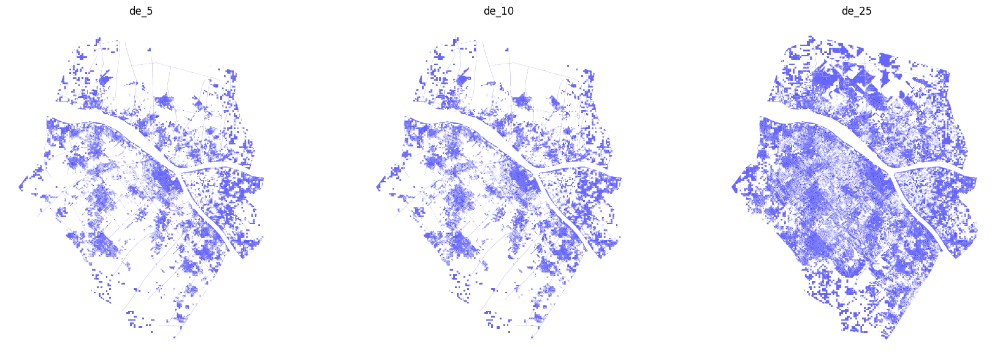

In [55]:
url_5 = "https://github.com/alzimna/ara/raw/refs/heads/main/Data%20USK/Flood%20Simulation%20(SHP)/Flood%20Simulation%20Normal%20Condition/de_5.shx"
url_10 = "https://github.com/alzimna/ara/raw/refs/heads/main/Data%20USK/Flood%20Simulation%20(SHP)/Flood%20Simulation%20Normal%20Condition/de_10.shx"
url_25 = "https://github.com/alzimna/ara/raw/refs/heads/main/Data%20USK/Flood%20Simulation%20(SHP)/Flood%20Simulation%20Normal%20Condition/de_25.shx"

de_5 = gpd.read_file(url_5)
de_10 = gpd.read_file(url_10)
de_25 = gpd.read_file(url_25)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

de_5.plot(ax=axes[0], color="blue", alpha=0.6)
axes[0].set_title("de_5")

de_10.plot(ax=axes[1], color="blue", alpha=0.6)
axes[1].set_title("de_10")

de_25.plot(ax=axes[2], color="blue", alpha=0.6)
axes[2].set_title("de_25")

for ax in axes:
    ax.set_axis_off()

plt.tight_layout()
plt.show()

RCP4.5 condition

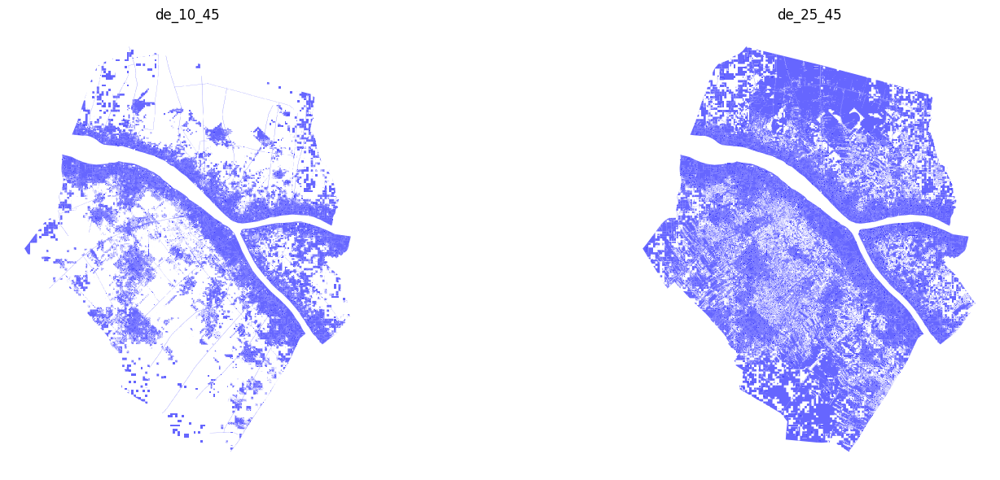

In [56]:
url_10_45 = "https://github.com/alzimna/ara/raw/refs/heads/main/Data%20USK/Flood%20Simulation%20(SHP)/Flood%20Simulation%20with%20RCP%204.5/de_10_45.shx"
url_25_45 = "https://github.com/alzimna/ara/raw/refs/heads/main/Data%20USK/Flood%20Simulation%20(SHP)/Flood%20Simulation%20with%20RCP%204.5/de_25_45.shx"

de_10_45 = gpd.read_file(url_10_45)
de_25_45 = gpd.read_file(url_25_45)

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

de_10_45.plot(ax=axes[0], color="blue", alpha=0.6)
axes[0].set_title("de_10_45")

de_25_45.plot(ax=axes[1], color="blue", alpha=0.6)
axes[1].set_title("de_25_45")

for ax in axes:
    ax.set_axis_off()

plt.tight_layout()
plt.show()

In [57]:
# with pd.ExcelWriter("coba_100m.xlsx", engine="xlsxwriter") as writer:
#     data_raw[data_raw["risk"]].assign(geometry=data_raw[data_raw["risk"]].geometry.to_wkt()) \
#         .to_excel(writer, sheet_name="main", index=False)

# Sample frame pakai buffer 100 m

## Cleaning Data

In [58]:
total = data_raw.copy()
total.drop(columns=["osm_id","osm_way_id","type","other_tags"], inplace=True)

In [59]:
cek = []
hapus = []
for i in range(len(total)) :
  if total.iloc[i,6] is None :
    temp = total.iloc[i,:]
    count = 0
    for item in temp[:21][::-1] :
      if item is not None :
        cek.append(item)
        break
      else :
        count+=1
    if (count == 21):
      hapus.append(i)
  elif total.iloc[i,6] != "yes" :
    cek.append(total.iloc[i,6])
  else :
    cek.append("reskom")


In [60]:
total.drop(hapus, inplace=True)
total.reset_index(drop=True, inplace=True)
total.loc[:,"Info"] = cek
total = total[["gmaps","geometry","Info","Desa","Kecamatan","Kota","risk"]].copy()
total

,gmaps,geometry,Info,Desa,Kecamatan,Kota,risk
0,"0.012294525036680203,109.29295637422888","MULTIPOLYGON (((109.29283 0.01336, 109.29362 0...",bus_station,Batu Layang,Kecamatan Pontianak Utara,Kota Pontianak,True
1,"0.009034650000000002,109.29889819999998","MULTIPOLYGON (((109.29878 0.00905, 109.29883 0...",reskom,Batu Layang,Kecamatan Pontianak Utara,Kota Pontianak,True
2,"0.008740998840660402,109.29890238420168","MULTIPOLYGON (((109.29877 0.00892, 109.29912 0...",reskom,Batu Layang,Kecamatan Pontianak Utara,Kota Pontianak,True
3,"0.008960233003002303,109.29850111920736","MULTIPOLYGON (((109.29825 0.00899, 109.29833 0...",reskom,Batu Layang,Kecamatan Pontianak Utara,Kota Pontianak,True
4,"0.008772981467637646,109.29723094613973","MULTIPOLYGON (((109.29727 0.00879, 109.29724 0...",reskom,Batu Layang,Kecamatan Pontianak Utara,Kota Pontianak,True
...,...,...,...,...,...,...,...
151599,"-0.059742684309680896,109.30542280980495","MULTIPOLYGON (((109.30543 -0.05962, 109.30552 ...",reskom,Sungai Bangkong,Kecamatan Pontianak Kota,Kota Pontianak,False
151600,"-0.059843411687336624,109.30573045906135","MULTIPOLYGON (((109.30577 -0.05974, 109.30583 ...",reskom,Sungai Bangkong,Kecamatan Pontianak Kota,Kota Pontianak,True
151601,"-0.05989979999999927,109.305544","MULTIPOLYGON (((109.3055 -0.05979, 109.30566 -...",reskom,Sungai Bangkong,Kecamatan Pontianak Kota,Kota Pontianak,False
151602,"-0.05968553547192793,109.30645411554305","MULTIPOLYGON (((109.30646 -0.05961, 109.30653 ...",reskom,Sungai Bangkong,Kecamatan Pontianak Kota,Kota Pontianak,True


In [61]:
url = "https://github.com/alzimna/ara/raw/refs/heads/main/mapping.xlsx"
temp = pd.read_excel(url)
mapping = dict(zip(temp["building"], temp["category"]))

total.loc[:,"Kategori"] = cek
total["Kategori"] = total["Kategori"].map(mapping)

In [62]:
h1 = "cemetery, garage, parking, wood, islet, grassland, village, pier, pitch,\
      swimming_pool, service, roof, harbour, scrub, forest, tennis, computer,\
      basketball, volleyball, cycling, heath, helipad, bicycle_parking, \
      parking_space, reservoir"
h1 = [word.strip() for word in h1.split(',')]
total = total[(~total["Info"].isin(h1))].copy().reset_index(drop=True).fillna("Unknown")
survey = total[total["risk"]].copy().reset_index(drop=True)

In [63]:
total.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 151400 entries, 0 to 151399
Data columns (total 8 columns):
 #   Column     Non-Null Count   Dtype   
---  ------     --------------   -----   
 0   gmaps      151400 non-null  object  
 1   geometry   151400 non-null  geometry
 2   Info       151400 non-null  object  
 3   Desa       151400 non-null  object  
 4   Kecamatan  151400 non-null  object  
 5   Kota       151400 non-null  object  
 6   risk       151400 non-null  bool    
 7   Kategori   151400 non-null  object  
dtypes: bool(1), geometry(1), object(6)
memory usage: 8.2+ MB


In [64]:
survey.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 55065 entries, 0 to 55064
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   gmaps      55065 non-null  object  
 1   geometry   55065 non-null  geometry
 2   Info       55065 non-null  object  
 3   Desa       55065 non-null  object  
 4   Kecamatan  55065 non-null  object  
 5   Kota       55065 non-null  object  
 6   risk       55065 non-null  bool    
 7   Kategori   55065 non-null  object  
dtypes: bool(1), geometry(1), object(6)
memory usage: 3.0+ MB


In [65]:
color_map = {
    "Agrikultur" : "#A3D977",
    "Bangunan Publik" : "#9B59B6",
    "Infrastruktur" : "#95A5A6",
    "Komersial dan Industri" : "#E74C3C",
    "Residensial" : "#F1C40F",
    "Residensial dan Komersial" : "#E67E22",
    "Unknown" : "black"
}
survey["color"] = survey["Kategori"].map(color_map)
total["color"] = total["Kategori"].map(color_map)

In [66]:
survey = survey.to_crs(epsg=3857)
survey["area"] = survey.geometry.area

pairs = gpd.sjoin(survey, survey, predicate="intersects", how="inner")
pairs = pairs[pairs.index != pairs["index_right"]]   # remove self-matches

to_drop = set()

for idx, group in pairs.groupby(pairs.index):
    # group indices = this index + all intersecting ones
    all_ids = {idx} | set(group["index_right"])
    sub = survey.loc[list(all_ids)]

    keep_idx = sub["area"].idxmax()   # keep the largest

    for i in all_ids:
        if i != keep_idx:
            to_drop.add(i)

survey = survey.drop(index=to_drop).to_crs(4326).copy()
survey

,gmaps,geometry,Info,Desa,Kecamatan,Kota,risk,Kategori,color,area
0,"0.012294525036680203,109.29295637422888","MULTIPOLYGON (((109.29283 0.01336, 109.29362 0...",bus_station,Batu Layang,Kecamatan Pontianak Utara,Kota Pontianak,True,Bangunan Publik,#9B59B6,22498.716937
1,"0.009034650000000002,109.29889819999998","MULTIPOLYGON (((109.29878 0.00905, 109.29883 0...",reskom,Batu Layang,Kecamatan Pontianak Utara,Kota Pontianak,True,Residensial dan Komersial,#E67E22,251.754110
2,"0.008740998840660402,109.29890238420168","MULTIPOLYGON (((109.29877 0.00892, 109.29912 0...",reskom,Batu Layang,Kecamatan Pontianak Utara,Kota Pontianak,True,Residensial dan Komersial,#E67E22,896.325880
3,"0.008960233003002303,109.29850111920736","MULTIPOLYGON (((109.29825 0.00899, 109.29833 0...",reskom,Batu Layang,Kecamatan Pontianak Utara,Kota Pontianak,True,Residensial dan Komersial,#E67E22,1093.931966
4,"0.008772981467637646,109.29723094613973","MULTIPOLYGON (((109.29727 0.00879, 109.29724 0...",reskom,Batu Layang,Kecamatan Pontianak Utara,Kota Pontianak,True,Residensial dan Komersial,#E67E22,35.573117
...,...,...,...,...,...,...,...,...,...,...
55059,"-0.0525778,109.30551835","MULTIPOLYGON (((109.30549 -0.05253, 109.30557 ...",reskom,Sungai Bangkong,Kecamatan Pontianak Kota,Kota Pontianak,True,Residensial dan Komersial,#E67E22,60.731005
55060,"-0.05249090510767254,109.30553296321312","MULTIPOLYGON (((109.30545 -0.0525, 109.30549 -...",reskom,Sungai Bangkong,Kecamatan Pontianak Kota,Kota Pontianak,True,Residensial dan Komersial,#E67E22,141.232076
55061,"-0.05956987791768404,109.30546592489704","MULTIPOLYGON (((109.30554 -0.05961, 109.30559 ...",reskom,Sungai Bangkong,Kecamatan Pontianak Kota,Kota Pontianak,True,Residensial dan Komersial,#E67E22,350.603778
55062,"-0.059843411687336624,109.30573045906135","MULTIPOLYGON (((109.30577 -0.05974, 109.30583 ...",reskom,Sungai Bangkong,Kecamatan Pontianak Kota,Kota Pontianak,True,Residensial dan Komersial,#E67E22,190.797635


In [67]:
geom1 = drainage.geometry.iloc[0]
geom2 = drainage.geometry.iloc[1]

luar = geom1.union(geom2)

drainage_ponti = luar.intersection(ponti.iloc[0]["geo"])
drainage_ponti = gpd.GeoDataFrame(geometry=[drainage_ponti], crs="EPSG:4326")

## Peta Total Bangunan Pontianak

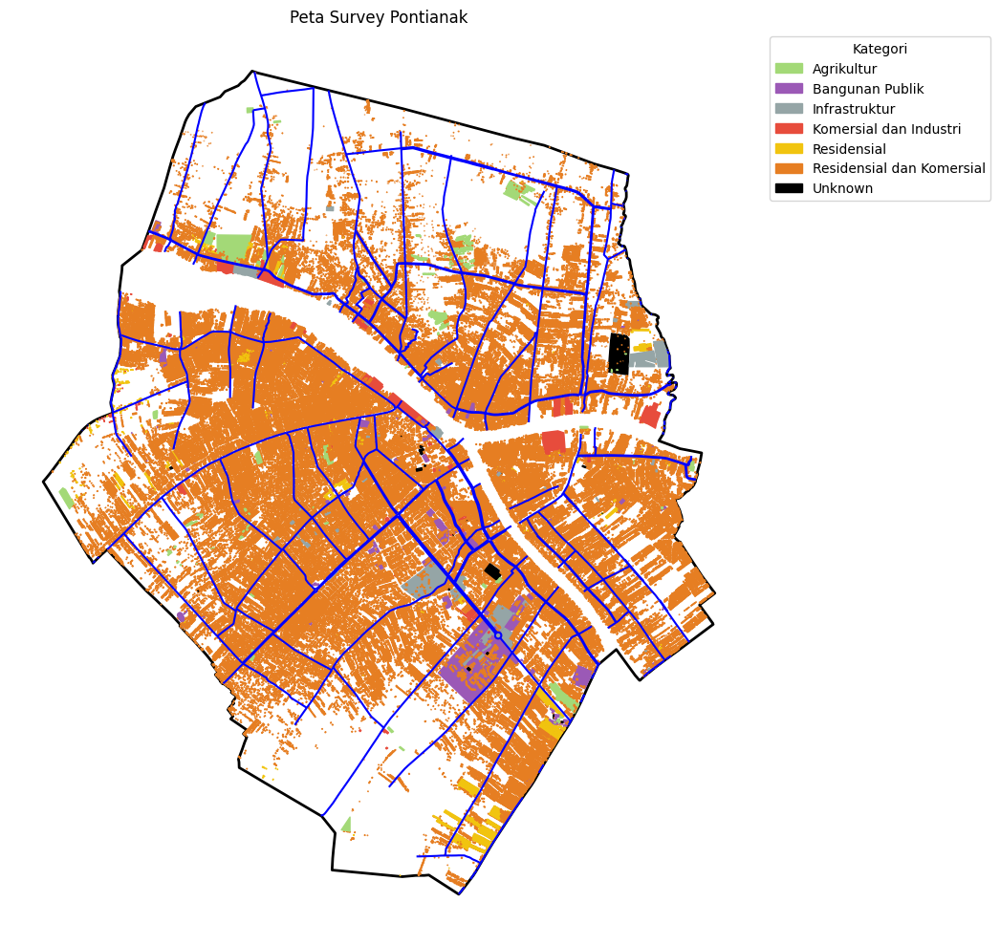

In [68]:
fig, ax = plt.subplots(figsize=(10,10))

ponti.plot(ax=ax,
           edgecolor="black",
           facecolor="none",
           linewidth=2)

total.plot(
    ax=ax,
    color=total["color"],
    edgecolor=total["color"]
)

drainage_ponti.plot(ax=ax, color="blue")

ax.set_title("Peta Survey Pontianak")

handles = [
    mpatches.Patch(color=col, label=cat)
    for cat, col in color_map.items()
]

ax.legend(
    handles=handles,
    title="Kategori",
    loc="upper left",
    bbox_to_anchor=(1.02, 1)
)


ax.set_axis_off()
plt.tight_layout()
plt.show()


## Peta Survey. Pontianak

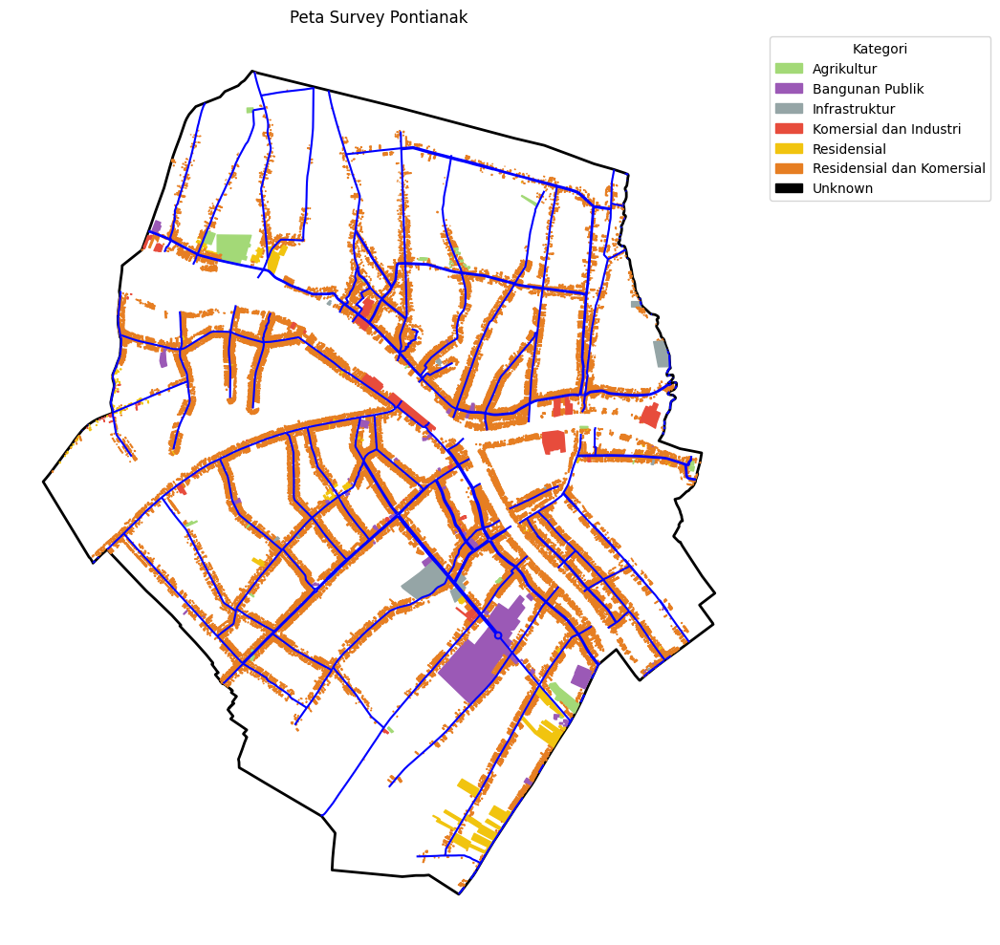

In [69]:
fig, ax = plt.subplots(figsize=(10,10))

ponti.plot(ax=ax,
           edgecolor="black",
           facecolor="none",
           linewidth=2)

survey.plot(
    ax=ax,
    color=survey["color"],
    edgecolor=survey["color"]
)

drainage_ponti.plot(ax=ax, color="blue")

ax.set_title("Peta Survey Pontianak")

handles = [
    mpatches.Patch(color=col, label=cat)
    for cat, col in color_map.items()
]

ax.legend(
    handles=handles,
    title="Kategori",
    loc="upper left",
    bbox_to_anchor=(1.02, 1)
)


ax.set_axis_off()
plt.tight_layout()
plt.show()


## Peta Survey Per Kecamatan


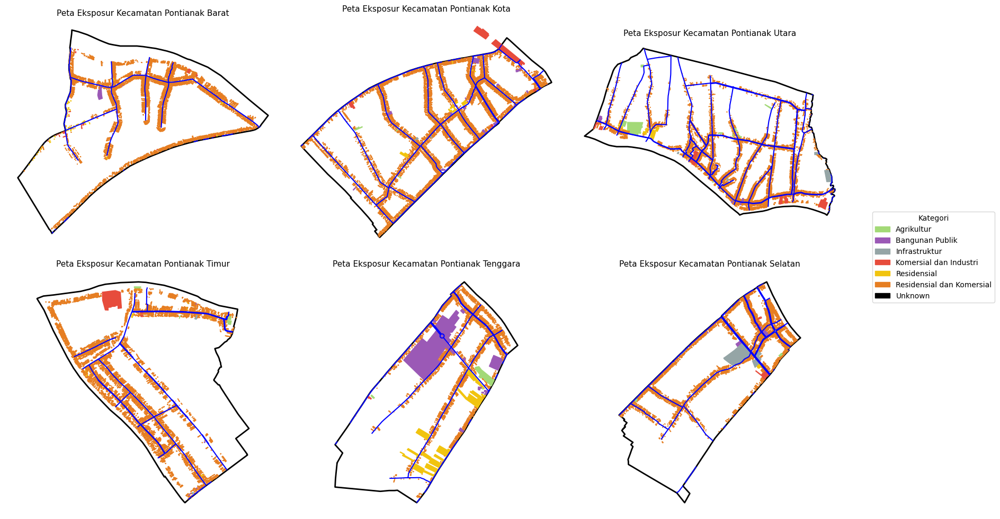

In [70]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

fig, axs = plt.subplots(2, 3, figsize=(18, 10))
axs = axs.flatten()

for i in range(6):
    ax = axs[i]

    nama = kec.iloc[i]["official_name"]
    g = kec.iloc[i]["geo"]
    temp = survey[survey["Kecamatan"] == nama].copy()

    # Plot Kecamatan boundary
    kec.iloc[[i]].plot(
        ax=ax,
        edgecolor="black",
        facecolor="none",
        linewidth=2
    )

    # Plot buildings
    temp.plot(
        ax=ax,
        color=temp["color"],
        edgecolor=temp["color"]
    )

    # Drainage inside kecamatan
    drainage_temp = luar.intersection(g)
    drainage_temp = gpd.GeoDataFrame(geometry=[drainage_temp], crs="EPSG:4326")
    drainage_temp.plot(ax=ax, color="blue")

    ax.set_title(f"Peta Eksposur {nama}", fontsize=11)
    ax.set_axis_off()

# Legend (one shared legend for all)
handles = [
    mpatches.Patch(color=col, label=cat)
    for cat, col in color_map.items()
]

fig.legend(
    handles=handles,
    title="Kategori",
    loc="center right",
    bbox_to_anchor=(1.05, 0.5)
)

plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()


In [71]:
survey = survey.sort_values(
    by=["Kecamatan","Desa", "area"],
    ascending=[True, True, False]   # area descending
).reset_index(drop=True).copy()

In [72]:
survey

,gmaps,geometry,Info,Desa,Kecamatan,Kota,risk,Kategori,color,area
0,"-0.02783972171483547,109.29907385724154","MULTIPOLYGON (((109.29878 -0.0278, 109.29901 -...",reskom,Pal Lima,Kecamatan Pontianak Barat,Kota Pontianak,True,Residensial dan Komersial,#E67E22,3317.990762
1,"-0.028889949999999998,109.29757915","MULTIPOLYGON (((109.29732 -0.02864, 109.29744 ...",reskom,Pal Lima,Kecamatan Pontianak Barat,Kota Pontianak,True,Residensial dan Komersial,#E67E22,1352.909979
2,"-0.028719200000000004,109.29721425000001","MULTIPOLYGON (((109.29699 -0.02861, 109.29719 ...",reskom,Pal Lima,Kecamatan Pontianak Barat,Kota Pontianak,True,Residensial dan Komersial,#E67E22,1267.699524
3,"-0.04006190365745784,109.28467583215472","MULTIPOLYGON (((109.2845 -0.04002, 109.28473 -...",reskom,Pal Lima,Kecamatan Pontianak Barat,Kota Pontianak,True,Residensial dan Komersial,#E67E22,774.526416
4,"-0.0303325701165308,109.29544274181076","MULTIPOLYGON (((109.29525 -0.03017, 109.29534 ...",reskom,Pal Lima,Kecamatan Pontianak Barat,Kota Pontianak,True,Residensial dan Komersial,#E67E22,752.797963
...,...,...,...,...,...,...,...,...,...,...
52993,"-0.018404258731661658,109.34814987196117","MULTIPOLYGON (((109.34814 -0.01838, 109.34817 ...",reskom,Siantan Tengah,Kecamatan Pontianak Utara,Kota Pontianak,True,Residensial dan Komersial,#E67E22,14.076045
52994,"-0.011871514398978565,109.35034432659934","MULTIPOLYGON (((109.35032 -0.01187, 109.35035 ...",reskom,Siantan Tengah,Kecamatan Pontianak Utara,Kota Pontianak,True,Residensial dan Komersial,#E67E22,11.857747
52995,"-0.01561933188861547,109.34248825689683","MULTIPOLYGON (((109.34247 -0.01562, 109.3425 -...",reskom,Siantan Tengah,Kecamatan Pontianak Utara,Kota Pontianak,True,Residensial dan Komersial,#E67E22,10.147151
52996,"-0.018473049999999998,109.34521455","MULTIPOLYGON (((109.3452 -0.01846, 109.34522 -...",reskom,Siantan Tengah,Kecamatan Pontianak Utara,Kota Pontianak,True,Residensial dan Komersial,#E67E22,7.696566


In [73]:
# survey.to_excel("survey_fix.xlsx", index=False)

## Pivot table per kecamatan

In [74]:
pivot_kec_survey = pd.pivot_table(
    survey,
    index="Kecamatan",
    columns="Kategori",
    aggfunc="size",
    fill_value=0
)
pivot_kec_survey["Unknown"] = 0
pivot_kec_survey["Grand Total"] = pivot_kec_survey.sum(axis=1)
pivot_kec_survey.loc["Grand Total"] = pivot_kec_survey.sum(axis=0)

pivot_kec_total = pd.pivot_table(
    total,
    index="Kecamatan",
    columns="Kategori",
    aggfunc="size",
    fill_value=0
)

pivot_kec_total["Grand Total"] = pivot_kec_total.sum(axis=1)
pivot_kec_total.loc["Grand Total"] = pivot_kec_total.sum(axis=0)

In [75]:
from IPython.display import display, HTML

html = "<div style='display:grid; grid-template-columns: repeat(3, 1fr); gap:12px;'>"

for item in survey.Kecamatan.unique():
    temp1 = pivot_kec_survey.loc[item].to_frame("Survey")
    temp2 = pivot_kec_total.loc[item].to_frame("Total")

    html += "<div style='border:1px solid #ccc; padding:8px;'>"
    html += f"<b>{item}</b>"
    html += pd.concat([temp1,temp2],axis = 1).to_html()
    html += "</div>"

html += "</div>"

display(HTML(html))

,Survey,Total
Kategori,,
Agrikultur,1,3
Bangunan Publik,6,21
Infrastruktur,0,0
Komersial dan Industri,43,50
Residensial,135,675
Residensial dan Komersial,8764,31115
Unknown,0,1
Grand Total,8949,31865
,Survey,Total


## Pivot table per desa

In [76]:
pivot_desa_survey = pd.pivot_table(
    survey,
    index="Desa",
    columns="Kategori",
    aggfunc="size",
    fill_value=0
)
pivot_desa_survey["Unknown"] = 0
pivot_desa_survey["Grand Total"] = pivot_desa_survey.sum(axis=1)
pivot_desa_survey.loc["Grand Total"] = pivot_desa_survey.sum(axis=0)

pivot_desa_total = pd.pivot_table(
    total,
    index="Desa",
    columns="Kategori",
    aggfunc="size",
    fill_value=0
)

pivot_desa_total["Grand Total"] = pivot_desa_total.sum(axis=1)
pivot_desa_total.loc["Grand Total"] = pivot_desa_total.sum(axis=0)

In [77]:
from IPython.display import display, HTML

html = "<div style='display:grid; grid-template-columns: repeat(3, 1fr); gap:12px;'>"

for item in survey.Desa.unique():
    temp1 = pivot_desa_survey.loc[item].to_frame("Survey")
    temp2 = pivot_desa_total.loc[item].to_frame("Total")

    html += "<div style='border:1px solid #ccc; padding:8px;'>"
    html += f"<b>{item}</b>"
    html += pd.concat([temp1,temp2],axis = 1).to_html()
    html += "</div>"

html += "</div>"

display(HTML(html))

,Survey,Total
Kategori,,
Agrikultur,1,3
Bangunan Publik,1,6
Infrastruktur,0,0
Komersial dan Industri,28,28
Residensial,42,341
Residensial dan Komersial,808,5272
Unknown,0,1
Grand Total,880,5651
,Survey,Total


# Cari data lahan pertanian Kubu Raya

# Batas Administratif Kubu Raya dan Pontianak

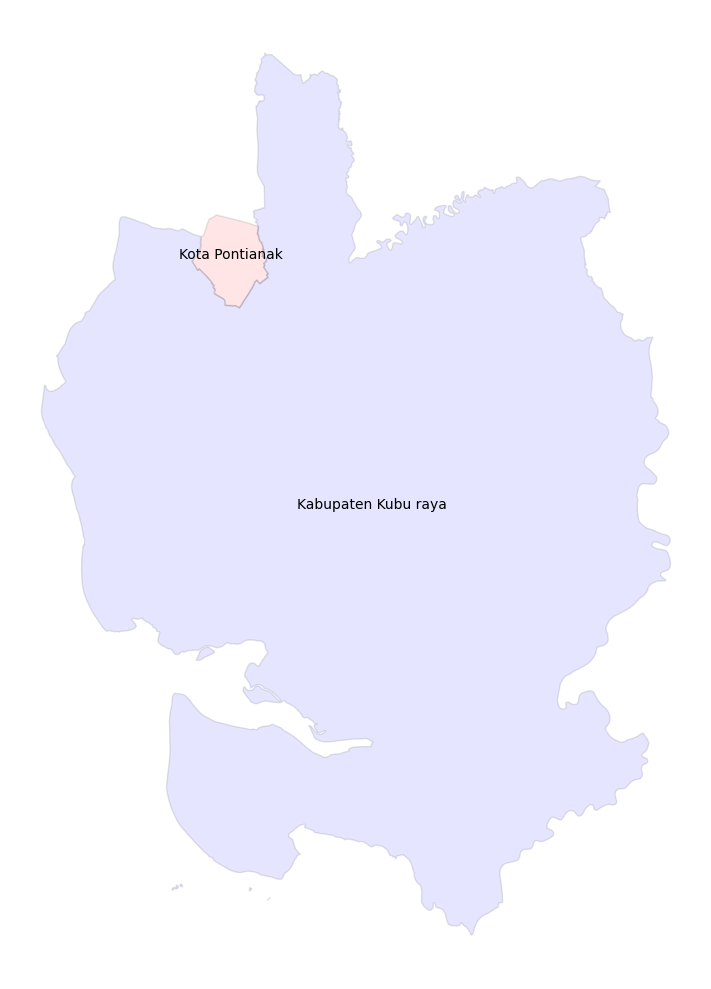

In [78]:
kuburaya = kalimantan[kalimantan["name"] == "Kubu Raya"]

fig = plt.figure(figsize=(10, 10))
ax = plt.axes()

ponti.plot(ax=ax,
              alpha=.1,
              facecolor='r',
              edgecolor="#000",
              linewidth=1)

kuburaya.plot(ax=ax,
              alpha=.1,
              facecolor='b',
              edgecolor="#000",
              linewidth=1)

ax.annotate(text = "Kota Pontianak",
            xy=(ponti.geo.centroid.x.iloc[0], ponti.geo.centroid.y.iloc[0]),
            horizontalalignment='center')
ax.annotate(text = "Kabupaten Kubu raya",
            xy=(kuburaya.geo.centroid.x.iloc[0], kuburaya.geo.centroid.y.iloc[0]),
            horizontalalignment='center')

ax.set_axis_off()
plt.tight_layout()
plt.show()

# Proxy Data lahan pertanian di Kubu Raya

Kita punya data OSM yang memuat data bangunan di Kabupaten Kubu Raya dan data land use Kalimantan per tanggal 2026-01-19 dari Geofabrik. Alternatif lain minta/cari data land use ke DLH Kubu Raya seperti yang dilakukan oleh USK.

Kita akan mengambil data bangunan_kuburaya_osm yang beririsan dengan buffer_ponti (bangunan di Kubu Raya yang berjarak 1 km dari perbatasan kota pontianak)

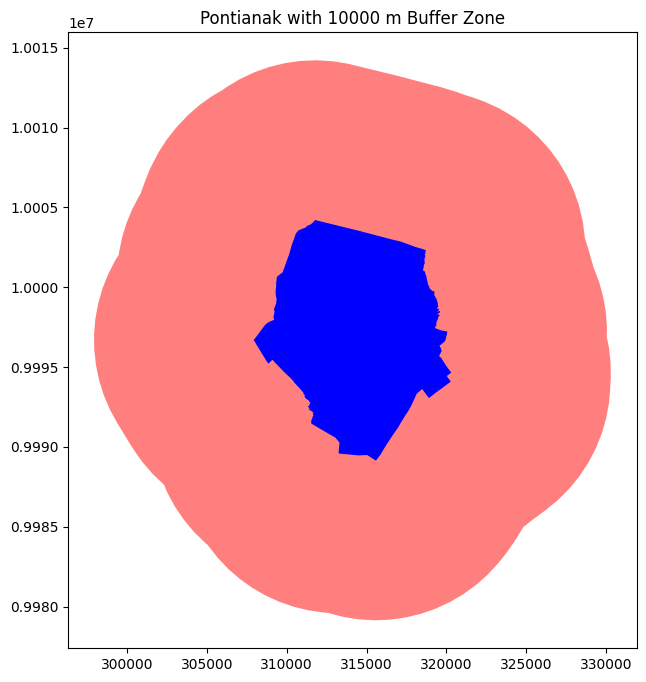

In [79]:
buff = 10000
ponti_m = ponti.to_crs(32749)
buffer_ponti = ponti_m.buffer(buff)

fig, ax = plt.subplots(figsize=(8,8))

buffer_ponti.plot(ax=ax, color="red", alpha=0.5, edgecolor="none")

ponti_m.plot(ax=ax, color="blue", linewidth=2)

plt.title(f'Pontianak with {buff} m Buffer Zone')
plt.show()

## Data Building OSM

In [92]:
#masking kuburaya
luar = kuburaya.iloc[0]["geo"]
mask = building_osm_luar.geometry.intersects(luar)
building_kuburaya_osm = building_osm_luar[mask].copy().reset_index(drop = True)

#masking buffer
luar = buffer_ponti.to_crs(4326).iloc[0]
mask = building_kuburaya_osm.geometry.intersects(luar)
cek_kuburaya_osm = building_kuburaya_osm[mask].copy()

#Ambil data building yang berhubungan dengan agrikultur
cek_kuburaya_osm = cek_kuburaya_osm[(cek_kuburaya_osm["building"] == "farm")
                   | (cek_kuburaya_osm["landuse"] == "farmland")
                   | (cek_kuburaya_osm["landuse"] == "farmyard")
                   | (cek_kuburaya_osm["building"] == "barn")].copy().reset_index(drop = True)

## Data Landuse Geofabrik

In [95]:
url = "https://github.com/alzimna/ara/raw/refs/heads/main/Kalimantan%20OSM%202026-01-19/gis_osm_landuse_a_free_1.shx"
land = gpd.read_file(url)

#masking kuburaya
luar = kuburaya.iloc[0]["geo"]
mask = land.geometry.within(luar)
cek_kuburaya_geofabrik = land[mask].copy()

#masking buffer
luar = buffer_ponti.to_crs(4326).iloc[0]
mask = cek_kuburaya_geofabrik.geometry.intersects(luar)
cek_kuburaya_geofabrik = cek_kuburaya_geofabrik[mask].copy()

cek_kuburaya_geofabrik = cek_kuburaya_geofabrik[cek_kuburaya_geofabrik["geometry"].notna()].copy()

#Ambil data landuse yang berhubungan dengan agrikultur
cek_kuburaya_geofabrik = cek_kuburaya_geofabrik[(cek_kuburaya_geofabrik["fclass"] == "farmyard")
                   | (cek_kuburaya_geofabrik["fclass"] == "farmland")].copy().reset_index(drop = True)

luar = gpd.GeoDataFrame(geometry=[luar], crs="EPSG:4326")

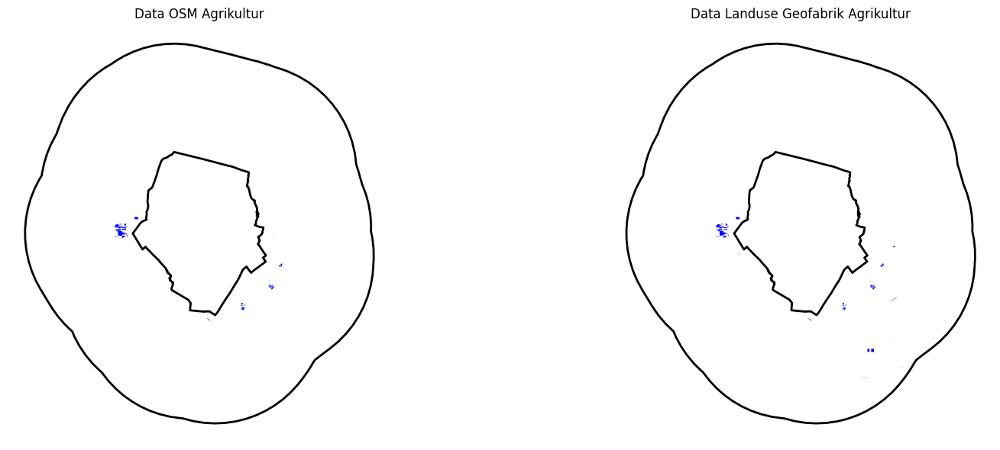

In [96]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

cek_kuburaya_osm.plot(ax=axes[0],
                      color="blue",
                      alpha=1)
ponti.plot(ax=axes[0],
           alpha=1,
           facecolor='none',
           edgecolor="black",
           linewidth=2)

luar.plot(ax=axes[0],
           alpha=1,
           facecolor='none',
           edgecolor="black",
           linewidth=2)

axes[0].set_title("Data OSM Agrikultur")

ponti.plot(ax=axes[1],
           alpha=1,
           facecolor='none',
           edgecolor="black",
           linewidth=2)

luar.plot(ax=axes[1],
           alpha=1,
           facecolor='none',
           edgecolor="black",
           linewidth=2)

cek_kuburaya_geofabrik.plot(ax=axes[1],
                            color="blue",
                            alpha=1)
axes[1].set_title("Data Landuse Geofabrik Agrikultur")

for ax in axes:
    ax.set_axis_off()

plt.tight_layout()
plt.show()

# Coba coba data kalimantan

In [83]:
url = f"https://api.github.com/repos/alzimna/ara/contents/Kalimantan%20OSM%202026-01-19"
response = requests.get(url)
data = response.json()
data_name = []
for item in data:
    temp = item["name"].split(".")
    try :
      format = temp[1]
      if format == "shx" :
        data_name.append(temp[0])
    except :
      pass

def cek_bangunan(kab) :
        if kab == "pontianak" :
            luar = ponti.iloc[0]["geo"]
        else :
            luar = kuburaya.iloc[0]["geo"]

        url = f"https://github.com/alzimna/ara/raw/refs/heads/main/Kalimantan%20OSM%202026-01-19/gis_osm_buildings_a_free_1.shx"
        gdf = gpd.read_file(url)

        mask = gdf.geometry.within(luar)
        gdf = gdf[mask].copy()

        gdf.drop_duplicates(subset=["geometry"], inplace=True)

        n = len(gdf)

        fig, ax = plt.subplots(figsize=(7,7))

        if kab == "pontianak" :
            ponti.plot(ax=ax,
                      alpha=1,
                      facecolor='none',
                      edgecolor="black",
                      linewidth=2)
        else :
            kuburaya.plot(ax=ax,
                      alpha=1,
                      facecolor='none',
                      edgecolor="black",
                      linewidth=2)

        gdf.plot(ax=ax,
                  edgecolor="red",
                  facecolor="red",
                  linewidth=1)

        ax.set_title(f"Building : {n} objects")
        ax.set_axis_off()
        plt.tight_layout()
        plt.show()

def cek_data(kab) :
  if kab == "pontianak" :
      luar = ponti.iloc[0]["geo"]
  else :
      luar = kuburaya.iloc[0]["geo"]

  for item in data_name[1:] :
      try :
        url = f"https://github.com/alzimna/ara/raw/refs/heads/main/Kalimantan%20OSM%202026-01-19/{item}.shx"
        gdf = gpd.read_file(url)

        mask = gdf.geometry.within(luar)
        gdf = gdf[mask].copy()

        gdf.drop_duplicates(subset=["geometry"], inplace=True)

        fig, ax = plt.subplots(figsize=(7,7))
        if kab == "pontianak" :
            ponti.plot(ax=ax,
                      alpha=1,
                      facecolor='none',
                      edgecolor="black",
                      linewidth=2)
        else :
            kuburaya.plot(ax=ax,
                      alpha=1,
                      facecolor='none',
                      edgecolor="black",
                      linewidth=2)

        gdf.plot(ax=ax,
                  edgecolor="black",
                  facecolor="red",
                  linewidth=1)

        plt.title(f"Plot {item.split("_")[2]} {kab}")
        ax.set_axis_off()
        plt.tight_layout()
        plt.show()
        plt.close(fig)
      except :
        print(f"File {item.split("_")[2]} tidak bisa diplot")

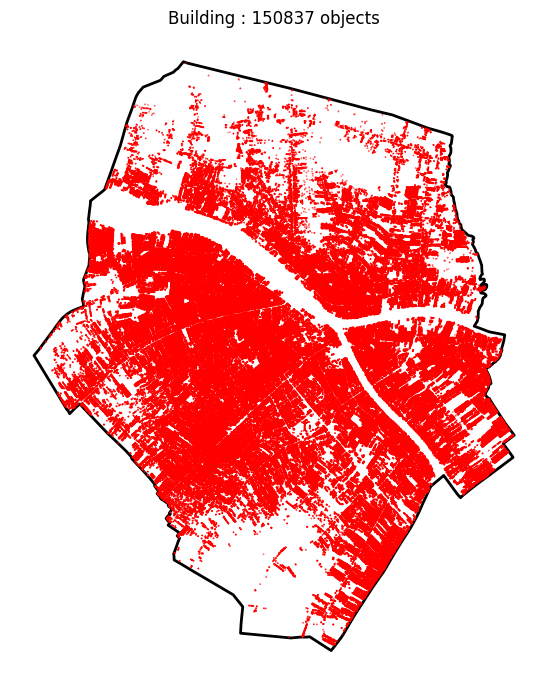

In [84]:
cek_bangunan("pontianak")

Data buildings dari Geofabrik tidak bisa memberikan informasi bangunan terkait mempunyai fungsi seperti apa. Namun, karena data tersebut selalu diupdate setiap hari, seharusnya jumlah bangunan mendekati jumlah seharusnya. Berikut data lain yang bisa kita dapatkan

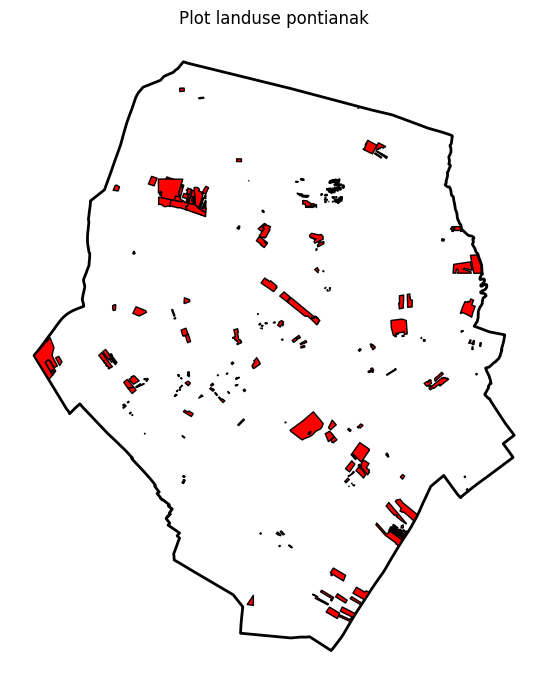

File natural tidak bisa diplot


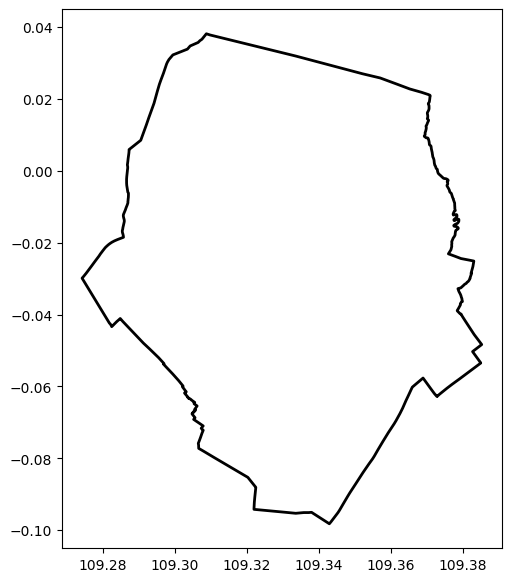

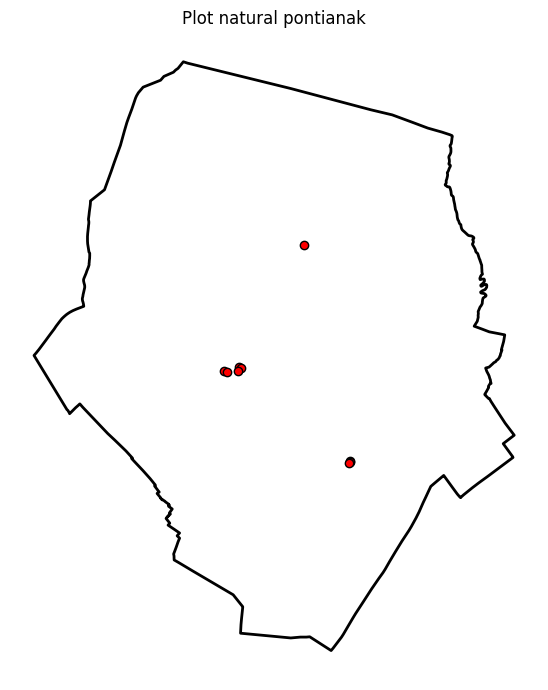

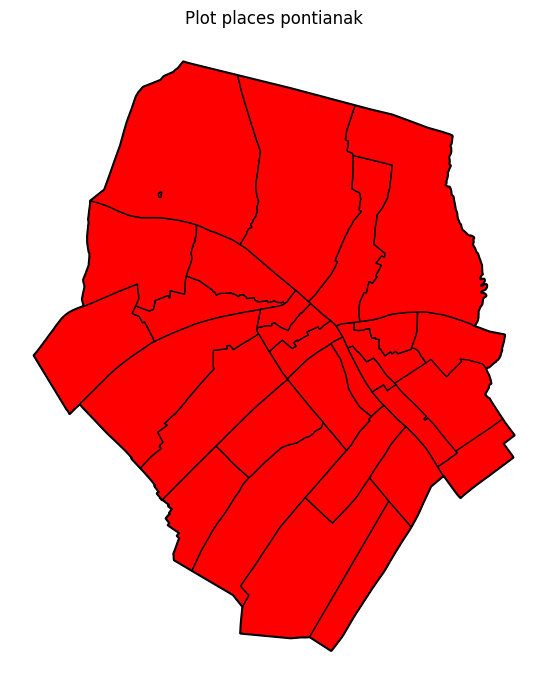

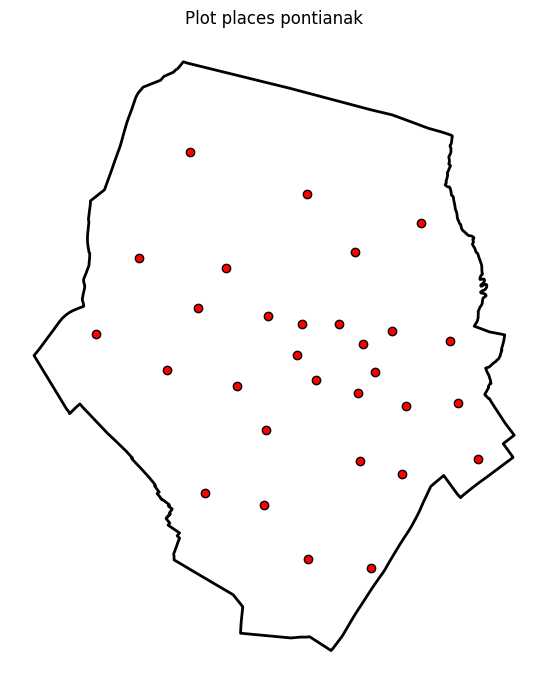

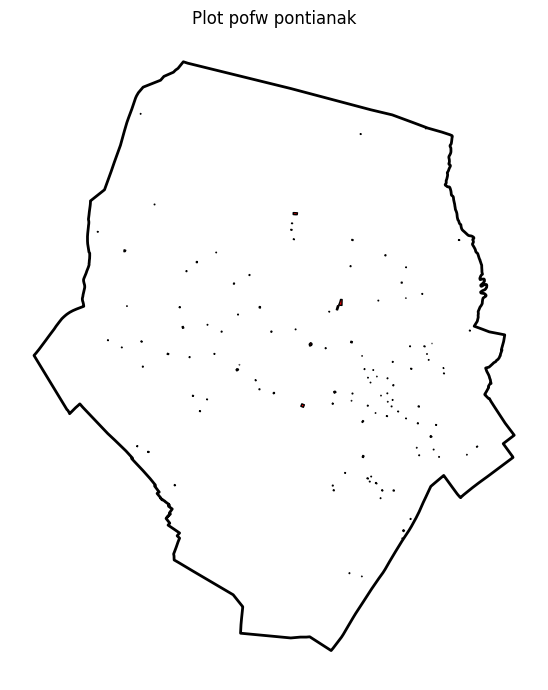

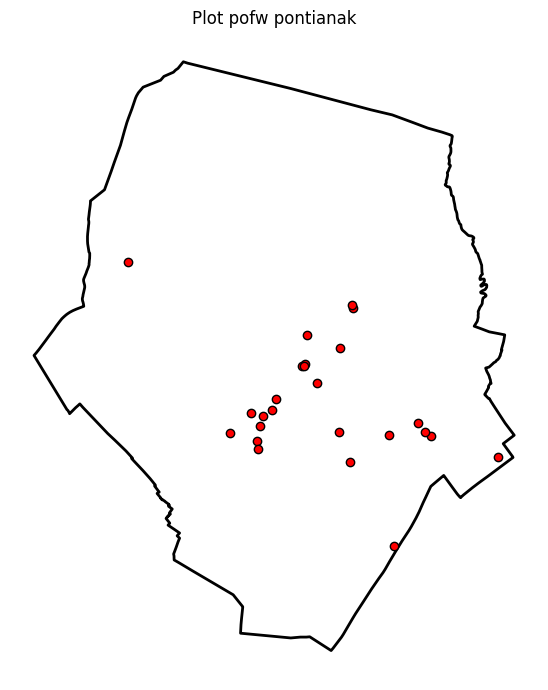

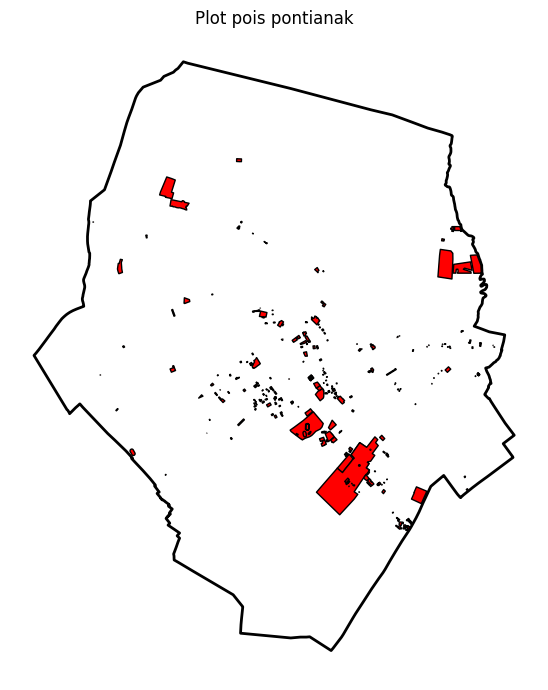

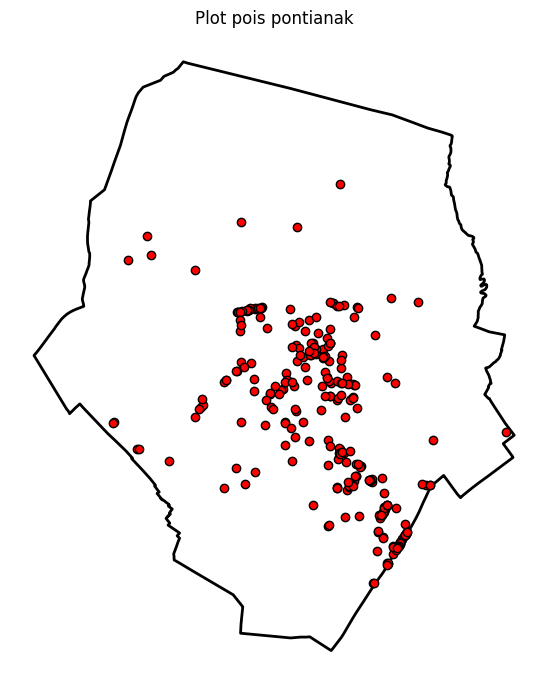

File railways tidak bisa diplot


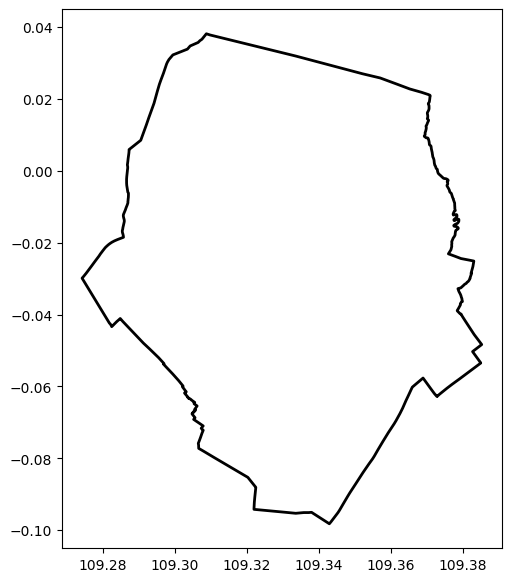

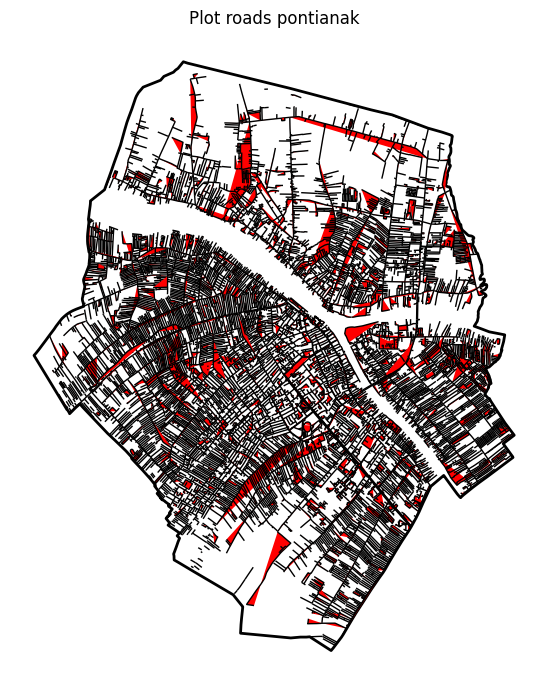

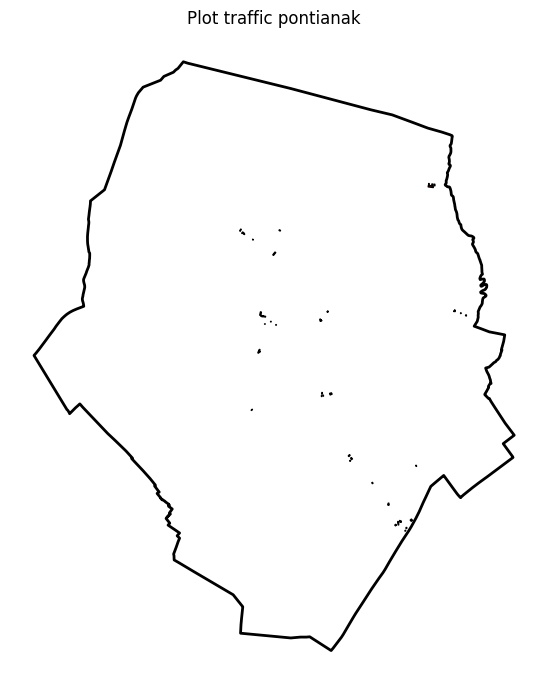

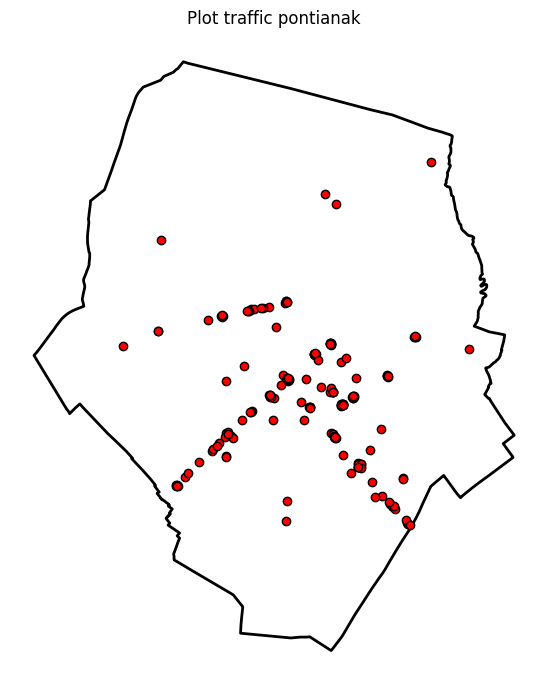

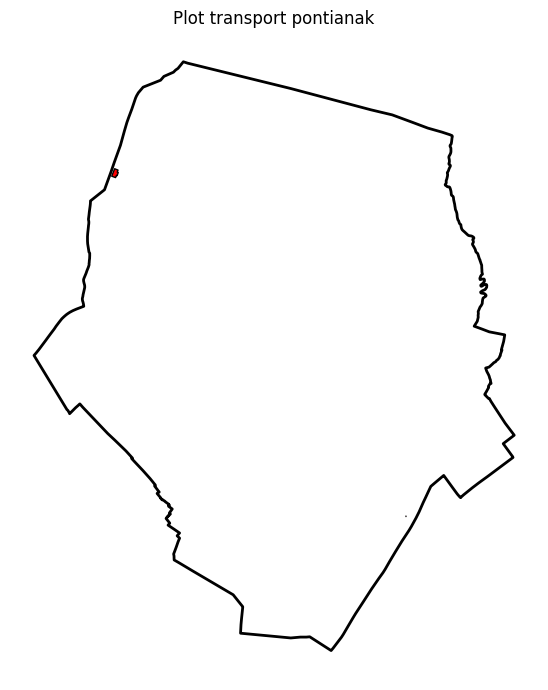

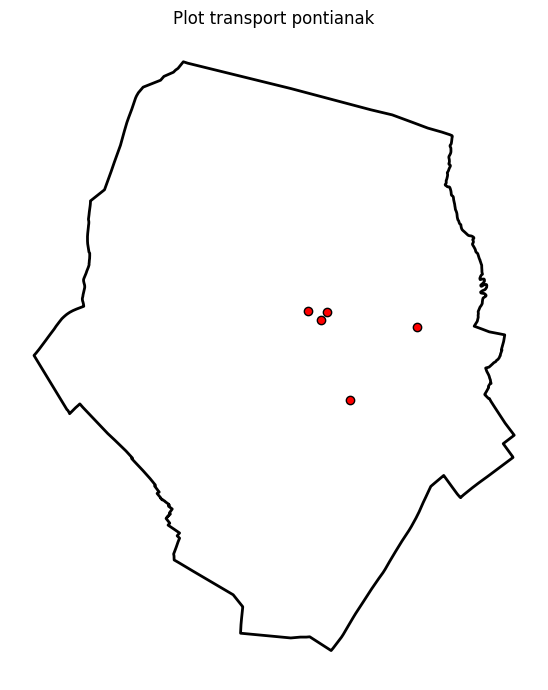

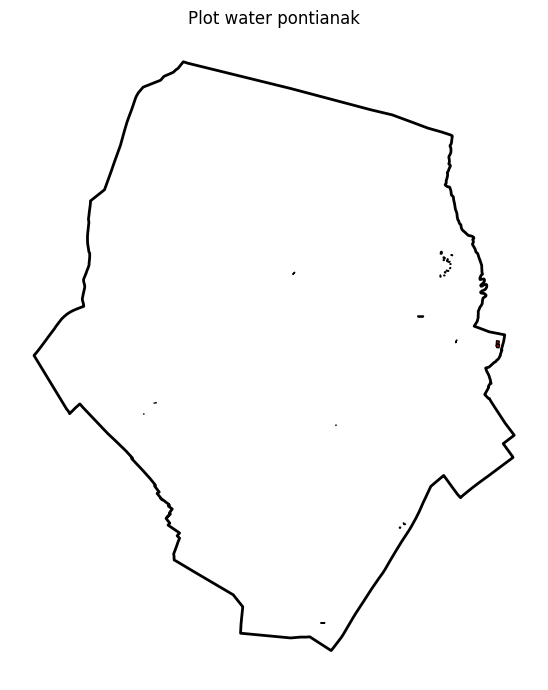

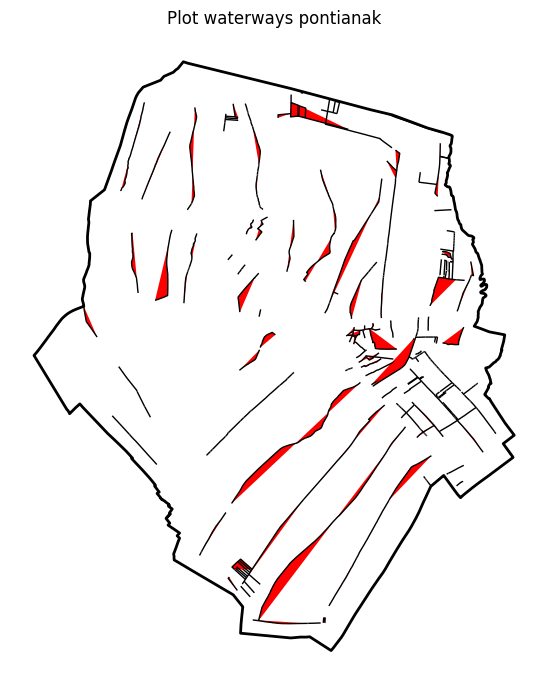

In [85]:
cek_data("pontianak")

# Provide gambar berdasarkan row data suvey

index 37985, gmaps = 0.01229,109.29296


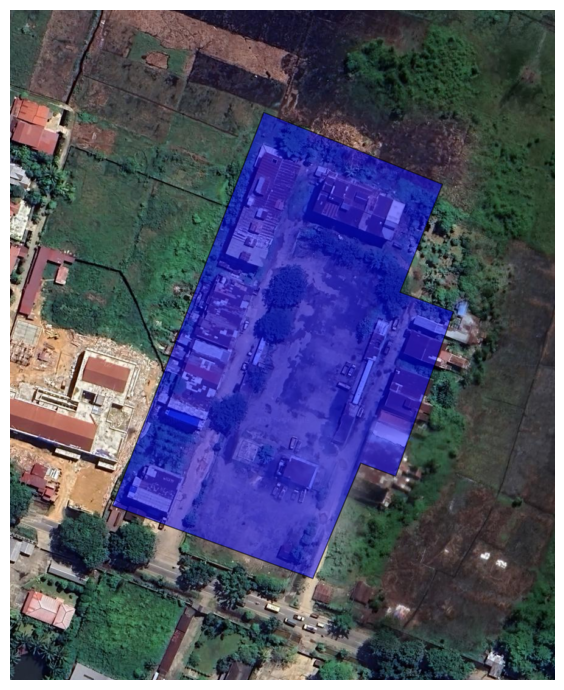

In [86]:
import contextily as ctx
import matplotlib.pyplot as plt

ceks = survey[survey["Info"]=="bus_station"]

padding = 50

for i in range(len(ceks)) :
    fig, ax = plt.subplots(figsize=(7,7))

    cek = survey.iloc[[ceks.index[i]]]
    # Ensure data is in Web Mercator (Required for Google Tiles)
    gdf_proj = cek.to_crs(epsg=3857)

    # Plot your data
    gdf_proj.plot(
        ax=ax,
        color='blue',       # The fill color
        edgecolor='black',  # The outline color
        linewidth=1,        # Thickness of the outline
        alpha=0.5,          # Transparency (0.0 transparent through 1.0 solid)
        zorder=2            # Keep the building on top of the map
    )

    # Get the bounding box of the building [minx, miny, maxx, maxy]
    bounds = gdf_proj.geometry.total_bounds

    # Apply the padding to make the view wider
    ax.set_xlim(bounds[0] - padding, bounds[2] + padding)
    ax.set_ylim(bounds[1] - padding, bounds[3] + padding)

    # Add Google Satellite Basemap
    # lyrs=s : Satellite only
    # lyrs=y : Hybrid (Satellite + Labels/Roads)
    google_url = "https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}"

    ctx.add_basemap(ax, source=google_url, zoom=19)

    judul = cek.iloc[0]['gmaps']
    idx = judul.find(',')
    kiri = round(float(judul[:idx]),5)
    kanan = round(float(judul[idx+1:]),5)
    judul = f"{kiri},{kanan}"

    ax.set_axis_off()
    plt.tight_layout()
    print(f"index {ceks.index[i]}, gmaps = {judul}")
    plt.show()
    plt.close(fig) # Important: free up memory